In [ ]:
!apt-get install graphviz libgraphviz-dev pkg-config
!pip install pygraphviz

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
graphviz is already the newest version (2.42.2-6ubuntu0.1).
The following packages were automatically installed and are no longer required:
  libbz2-dev libpkgconf3 libreadline-dev
Use 'apt autoremove' to remove them.
The following additional packages will be installed:
  libgail-common libgail18 libgtk2.0-0 libgtk2.0-bin libgtk2.0-common
  libgvc6-plugins-gtk librsvg2-common libxdot4
Suggested packages:
  gvfs
The following packages will be REMOVED:
  pkgconf r-base-dev
The following NEW packages will be installed:
  libgail-common libgail18 libgraphviz-dev libgtk2.0-0 libgtk2.0-bin
  libgtk2.0-common libgvc6-plugins-gtk librsvg2-common libxdot4 pkg-config
0 upgraded, 10 newly installed, 2 to remove and 35 not upgraded.
Need to get 2,482 kB of archives.
After this operation, 7,671 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/main amd64 pkg-config a

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from IPython import get_ipython
from IPython.display import display
from pandas import *
import networkx as nx
import matplotlib.pyplot as plt
import random
import pygraphviz

data = read_csv("/content/drive/MyDrive/SEM 8/RSL LAB/covid_data.csv")

student_names = data["Name"].tolist()
no_of_students = len(student_names)

student_interaction_before_pandemic = data["Your interaction group before the pandemic (Please mention the number)"].tolist()
student_interaction_during_pandemic = data["Your interaction group during the pandemic (Please mention the number)"].tolist()
student_interaction_after_pandemic = data["Your interaction group after the pandemic (Please mention the number)"].tolist()
student_course_of_study = data["Course of Study"].tolist()
student_year_of_study = data["Year of Study"].tolist()
student_gender = data["Gender"].tolist()


for index in range(no_of_students):
    student_names[index] = "Student" + str(index+1)

print("No of students: ", no_of_students)

student_graph_before_covid = nx.Graph()
student_graph_during_covid = nx.Graph()
student_graph_after_covid = nx.Graph()

for index, row in data.iterrows():
    student_name = "Student" + str(index+1)
    properties = row.drop('Name').to_dict()
    student_graph_before_covid.add_node(student_name, **properties)
    student_graph_during_covid.add_node(student_name, **properties)
    student_graph_after_covid.add_node(student_name, **properties)


No of students:  126


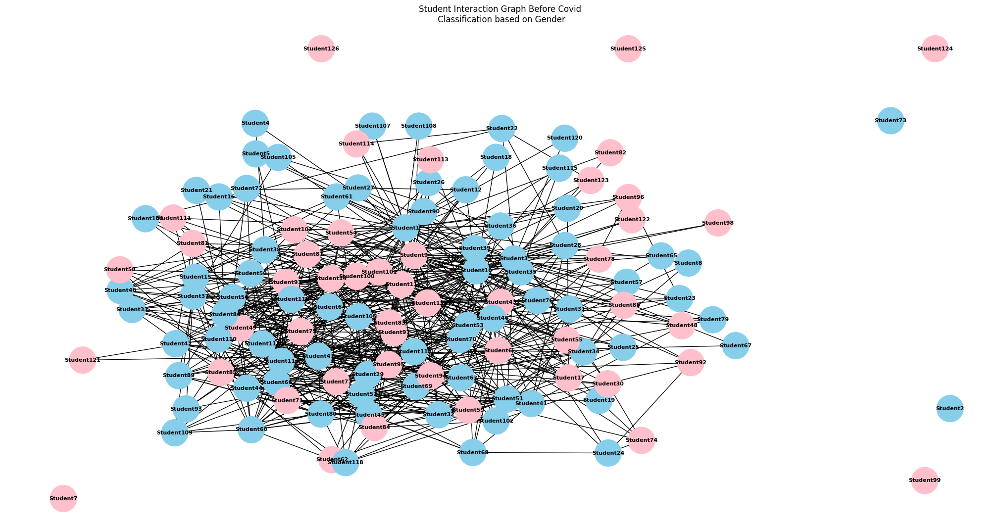

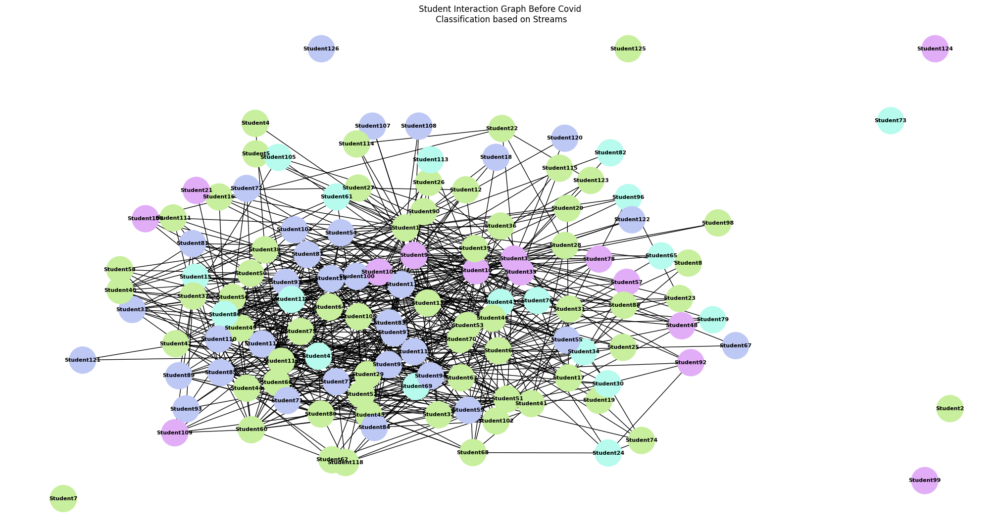

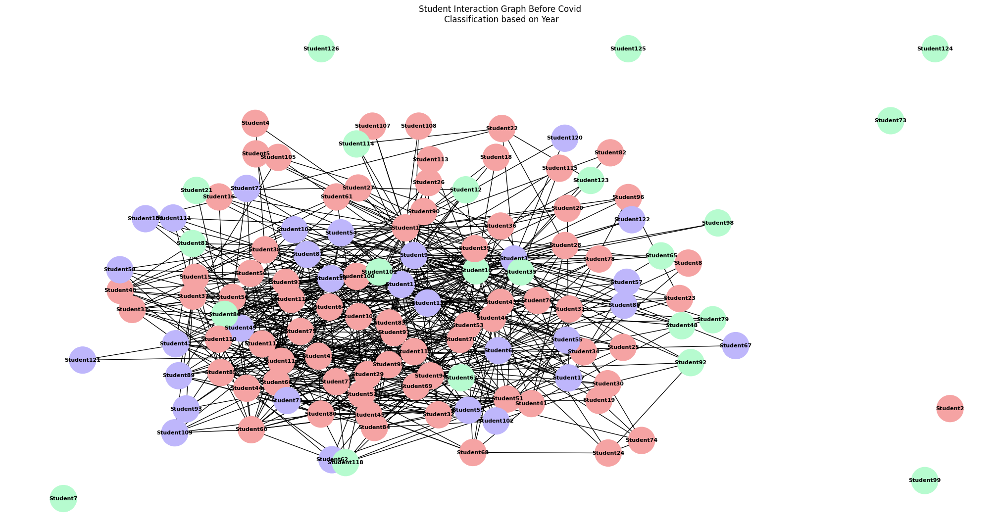

In [ ]:
#Constructing the before covid network

for i in range(no_of_students-1):
  choice_array = [no for no in range(i+1, no_of_students)]
  while student_interaction_before_pandemic[i] > 0:
    random_number = random.choice(choice_array)
    while student_interaction_before_pandemic[random_number]==0:
      choice_array.remove(random_number)
      if len(choice_array) == 0:
        break
      random_number = random.choice(choice_array)
    if len(choice_array) == 0:
        break
    if not student_graph_before_covid.has_edge(student_names[i], student_names[random_number]):
        student_graph_before_covid.add_edge(student_names[i], student_names[random_number])
        student_interaction_before_pandemic[random_number]-=1
        student_interaction_before_pandemic[i]-=1
        choice_array.remove(random_number)
        if len(choice_array) == 0:
          break
    else:
      choice_array.remove(random_number)
      if len(choice_array) == 0:
        break

color_mapping = {'Male': 'skyblue', 'Female': 'pink', 'Prefer not to say': 'grey'}
node_colors = [color_mapping[student_graph_before_covid.nodes[node]['Gender']] for node in student_graph_before_covid.nodes]

plt.figure(figsize=(20, 10))
pos = nx.nx_agraph.graphviz_layout(student_graph_before_covid, prog="neato")
nx.draw(student_graph_before_covid, pos=pos, with_labels=True, node_size=1500,
        node_color=node_colors, font_size=8, font_color="black", font_weight="bold")
plt.title("Student Interaction Graph Before Covid\n Classification based on Gender")
plt.show()

print("\n\n")

color_mapping = {'MSc Theoretical Computer Science': '#c8ef9d', 'MSc Data Science': '#b6fbed', 'MSc Cyber Security': '#e2adf7', 'MSc Software Systems':'#bec8f5'}
node_colors = [color_mapping[student_graph_before_covid.nodes[node]['Course of Study']] for node in student_graph_before_covid.nodes]

plt.figure(figsize=(20, 10))
pos = nx.nx_agraph.graphviz_layout(student_graph_before_covid, prog="neato")
nx.draw(student_graph_before_covid, pos=pos, with_labels=True, node_size=1500,
        node_color=node_colors, font_size=8, font_color="black", font_weight="bold")
plt.title("Student Interaction Graph Before Covid\n Classification based on Streams")
plt.show()
print("\n\n")

color_mapping = {'2020-25': '#b6fbcf', '2021-26': '#beb6fb', '2019-24': '#f5a3a3', '':'f5eca3'}
node_colors = [color_mapping[student_graph_before_covid.nodes[node]['Year of Study']] for node in student_graph_before_covid.nodes]

plt.figure(figsize=(20, 10))
pos = nx.nx_agraph.graphviz_layout(student_graph_before_covid, prog="neato")
nx.draw(student_graph_before_covid, pos=pos, with_labels=True, node_size=1500,
        node_color=node_colors, font_size=8, font_color="black", font_weight="bold")
plt.title("Student Interaction Graph Before Covid\n Classification based on Year")
plt.show()
print("\n\n")


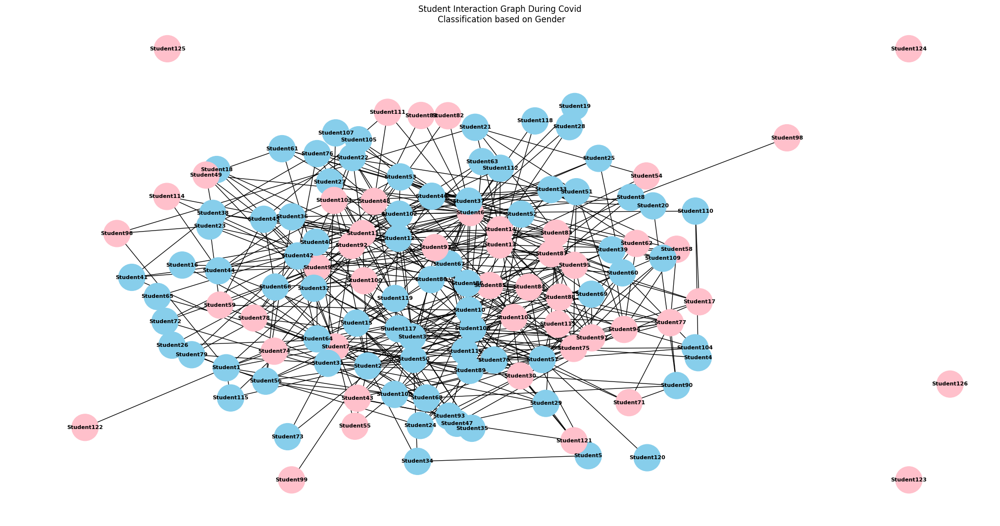

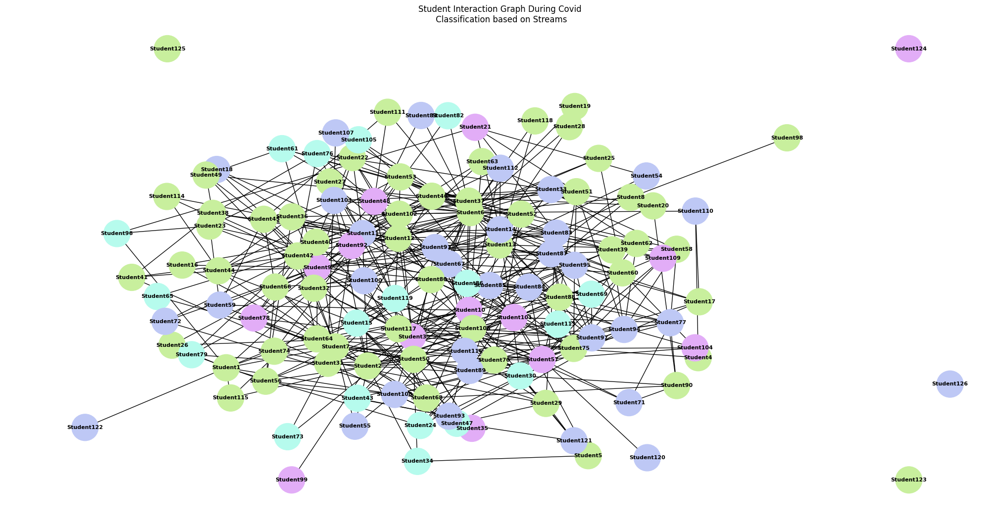

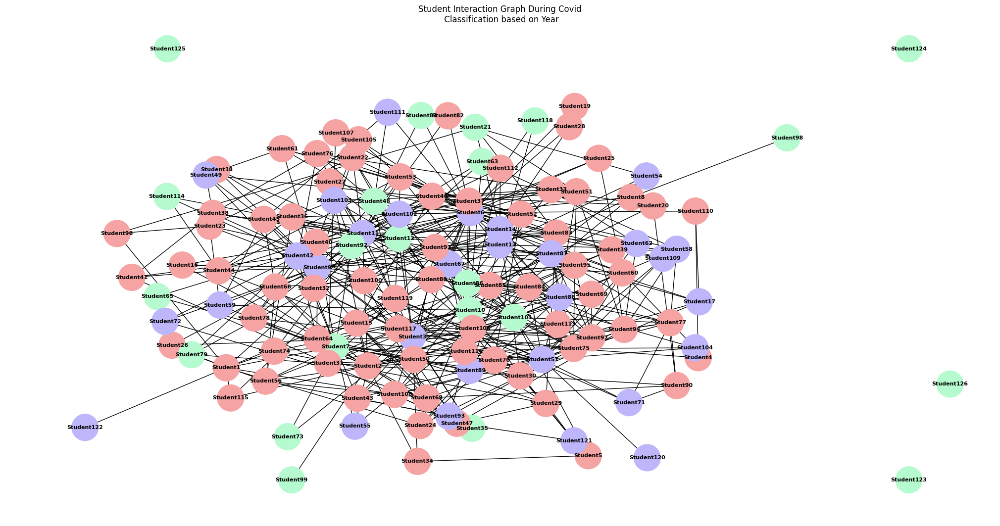

In [ ]:
#Constructing the during covid network

for i in range(no_of_students-1):
  choice_array = [no for no in range(i+1, no_of_students)]
  while student_interaction_during_pandemic[i] > 0:
    random_number = random.choice(choice_array)
    while student_interaction_during_pandemic[random_number]==0:
      choice_array.remove(random_number)
      if len(choice_array) == 0:
        break
      random_number = random.choice(choice_array)
    if len(choice_array) == 0:
        break
    if not student_graph_during_covid.has_edge(student_names[i], student_names[random_number]):
        student_graph_during_covid.add_edge(student_names[i], student_names[random_number])
        student_interaction_during_pandemic[random_number]-=1
        student_interaction_during_pandemic[i]-=1
        choice_array.remove(random_number)
        if len(choice_array) == 0:
          break
    else:
      choice_array.remove(random_number)
      if len(choice_array) == 0:
        break

color_mapping = {'Male': 'skyblue', 'Female': 'pink', 'Prefer not to say': 'grey'}
node_colors = [color_mapping[student_graph_during_covid.nodes[node]['Gender']] for node in student_graph_during_covid.nodes]


plt.figure(figsize=(20, 10))
pos = nx.nx_agraph.graphviz_layout(student_graph_during_covid, prog="neato")
nx.draw(student_graph_during_covid, pos=pos, with_labels=True, node_size=1500, node_color=node_colors, font_size=8, font_color="black", font_weight="bold")
plt.title("Student Interaction Graph During Covid\n Classification based on Gender")
plt.show()
print("\n\n")

color_mapping = {'MSc Theoretical Computer Science': '#c8ef9d', 'MSc Data Science': '#b6fbed', 'MSc Cyber Security': '#e2adf7', 'MSc Software Systems':'#bec8f5'}
node_colors = [color_mapping[student_graph_during_covid.nodes[node]['Course of Study']] for node in student_graph_during_covid.nodes]

plt.figure(figsize=(20, 10))
pos = nx.nx_agraph.graphviz_layout(student_graph_during_covid, prog="neato")
nx.draw(student_graph_during_covid, pos=pos, with_labels=True, node_size=1500,
        node_color=node_colors, font_size=8, font_color="black", font_weight="bold")
plt.title("Student Interaction Graph During Covid\n Classification based on Streams")
plt.show()
print("\n\n")

color_mapping = {'2020-25': '#b6fbcf', '2021-26': '#beb6fb', '2019-24': '#f5a3a3', '':'f5eca3'}
node_colors = [color_mapping[student_graph_during_covid.nodes[node]['Year of Study']] for node in student_graph_during_covid.nodes]

plt.figure(figsize=(20, 10))
pos = nx.nx_agraph.graphviz_layout(student_graph_during_covid, prog="neato")
nx.draw(student_graph_during_covid, pos=pos, with_labels=True, node_size=1500,
        node_color=node_colors, font_size=8, font_color="black", font_weight="bold")
plt.title("Student Interaction Graph During Covid\n Classification based on Year")
plt.show()
print("\n\n")


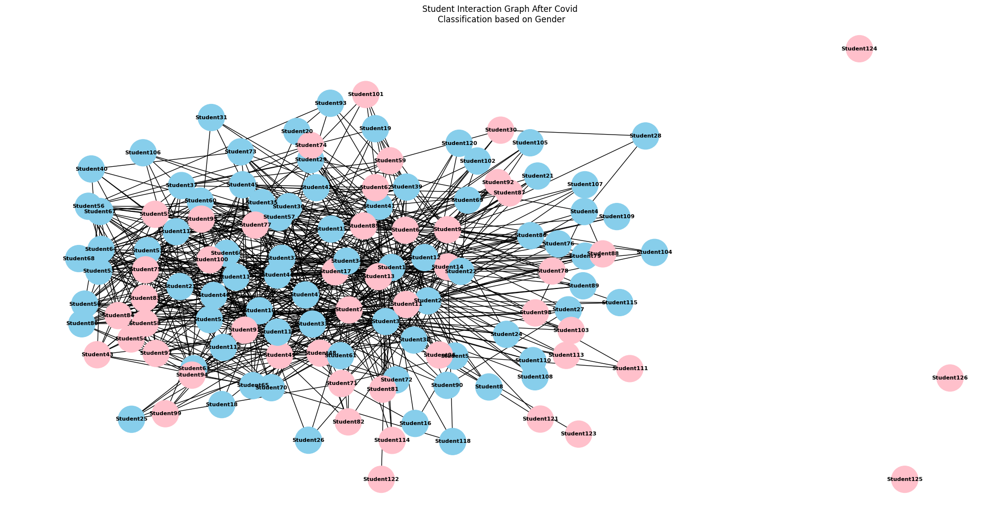

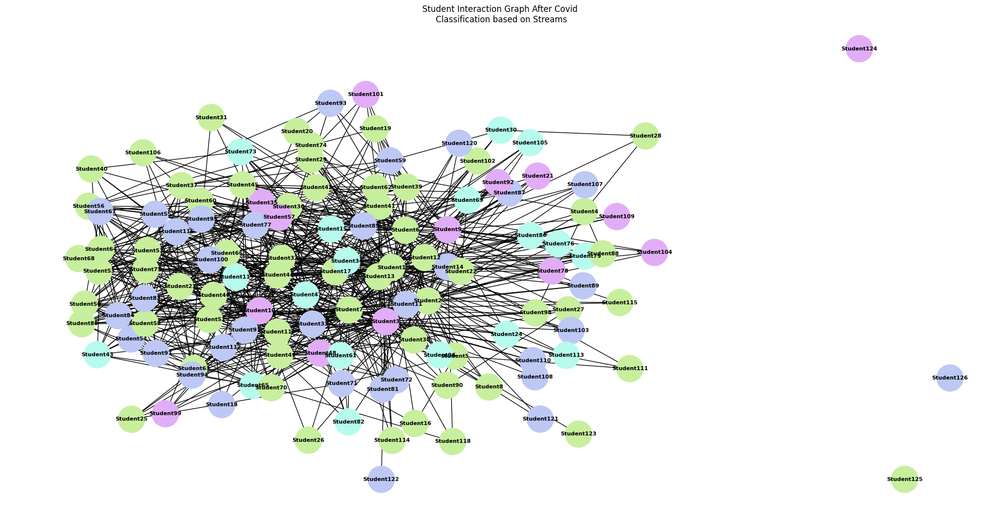

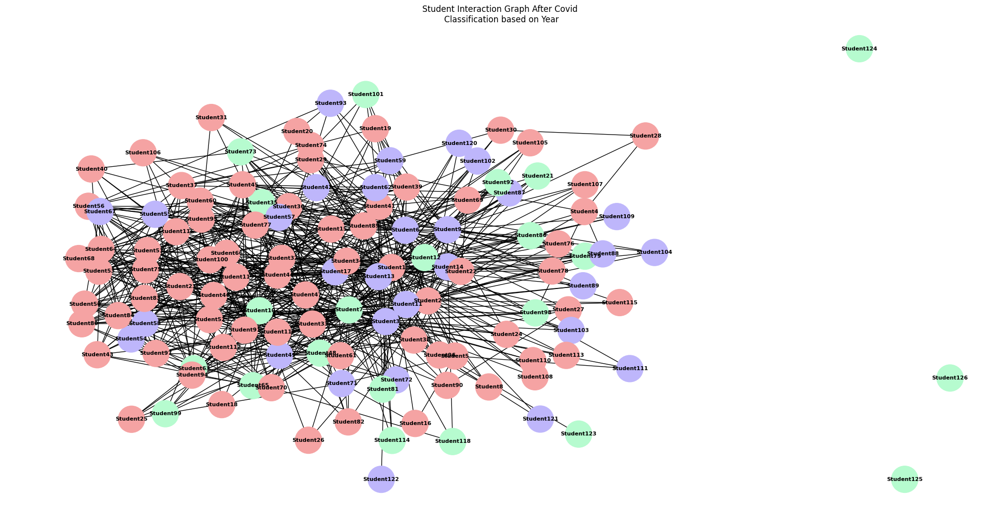

In [ ]:
#Constructing the after covid network

#after covid

for i in range(no_of_students-1):
  choice_array = [no for no in range(i+1, no_of_students)]
  while student_interaction_after_pandemic[i] > 0:
    random_number = random.choice(choice_array)
    while student_interaction_after_pandemic[random_number]==0:
      choice_array.remove(random_number)
      if len(choice_array) == 0:
        break
      random_number = random.choice(choice_array)
    if len(choice_array) == 0:
        break
    if not student_graph_after_covid.has_edge(student_names[i], student_names[random_number]):
        student_graph_after_covid.add_edge(student_names[i], student_names[random_number])
        student_interaction_after_pandemic[random_number]-=1
        student_interaction_after_pandemic[i]-=1
        choice_array.remove(random_number)
        if len(choice_array) == 0:
          break
    else:
      choice_array.remove(random_number)
      if len(choice_array) == 0:
        break

color_mapping = {'Male': 'skyblue', 'Female': 'pink', 'Prefer not to say': 'grey'}
node_colors = [color_mapping[student_graph_after_covid.nodes[node]['Gender']] for node in student_graph_after_covid.nodes]
plt.figure(figsize=(20, 10))
pos = nx.nx_agraph.graphviz_layout(student_graph_after_covid, prog="neato")
nx.draw(student_graph_after_covid, pos=pos, with_labels=True, node_size=1500, node_color=node_colors, font_size=8, font_color="black", font_weight="bold")
plt.title("Student Interaction Graph After Covid\n Classification based on Gender")
plt.show()
print("\n\n")

color_mapping = {'MSc Theoretical Computer Science': '#c8ef9d', 'MSc Data Science': '#b6fbed', 'MSc Cyber Security': '#e2adf7', 'MSc Software Systems':'#bec8f5'}
node_colors = [color_mapping[student_graph_after_covid.nodes[node]['Course of Study']] for node in student_graph_after_covid.nodes]

plt.figure(figsize=(20, 10))
pos = nx.nx_agraph.graphviz_layout(student_graph_after_covid, prog="neato")
nx.draw(student_graph_after_covid, pos=pos, with_labels=True, node_size=1500,
        node_color=node_colors, font_size=8, font_color="black", font_weight="bold")
plt.title("Student Interaction Graph After Covid\n Classification based on Streams")
plt.show()
print("\n\n")

color_mapping = {'2020-25': '#b6fbcf', '2021-26': '#beb6fb', '2019-24': '#f5a3a3', '':'f5eca3'}
node_colors = [color_mapping[student_graph_after_covid.nodes[node]['Year of Study']] for node in student_graph_after_covid.nodes]

plt.figure(figsize=(20, 10))
pos = nx.nx_agraph.graphviz_layout(student_graph_after_covid, prog="neato")
nx.draw(student_graph_after_covid, pos=pos, with_labels=True, node_size=1500,
        node_color=node_colors, font_size=8, font_color="black", font_weight="bold")
plt.title("Student Interaction Graph After Covid\n Classification based on Year")
plt.show()


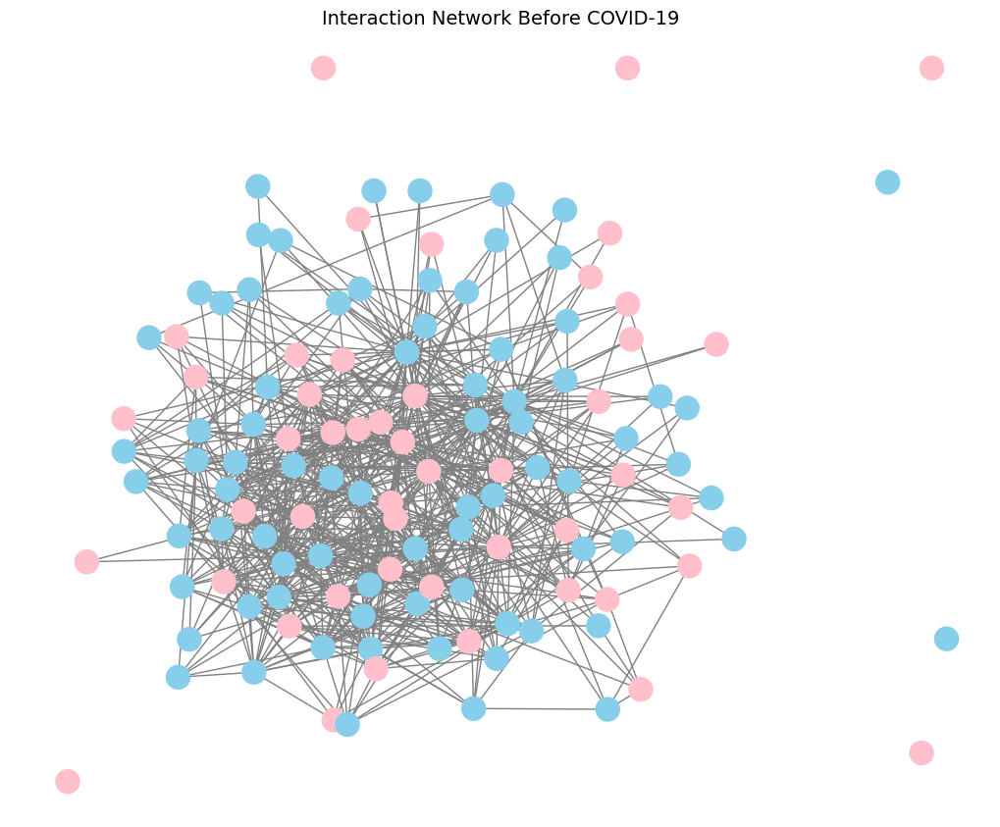

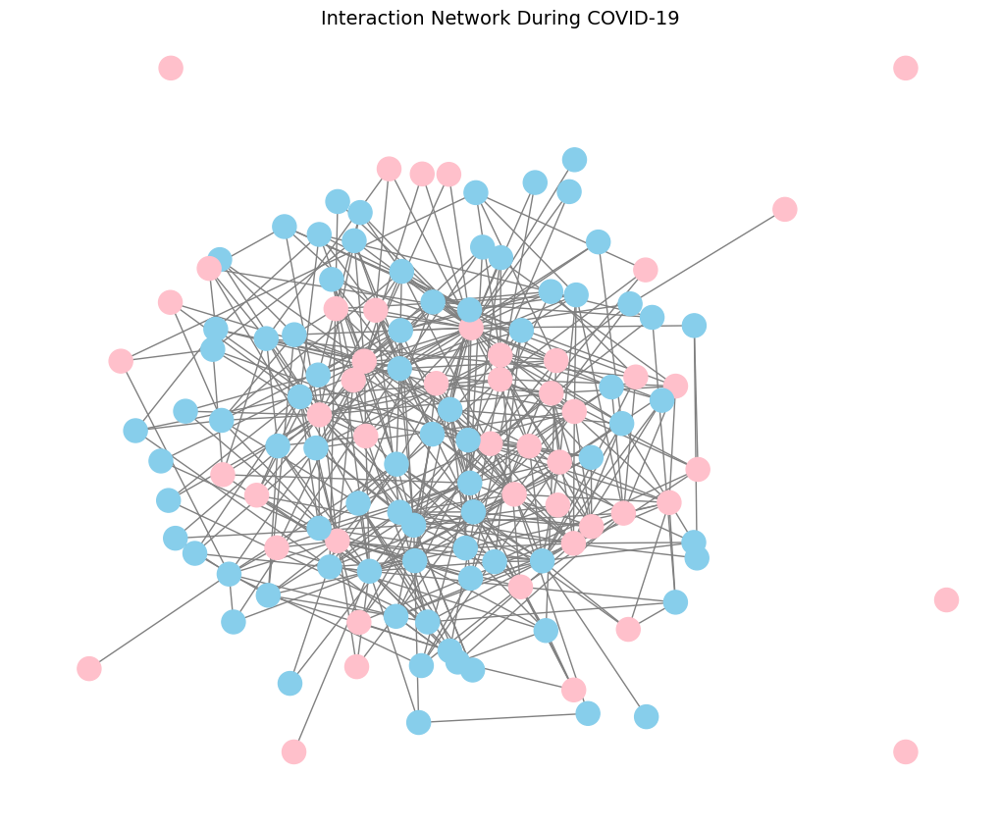

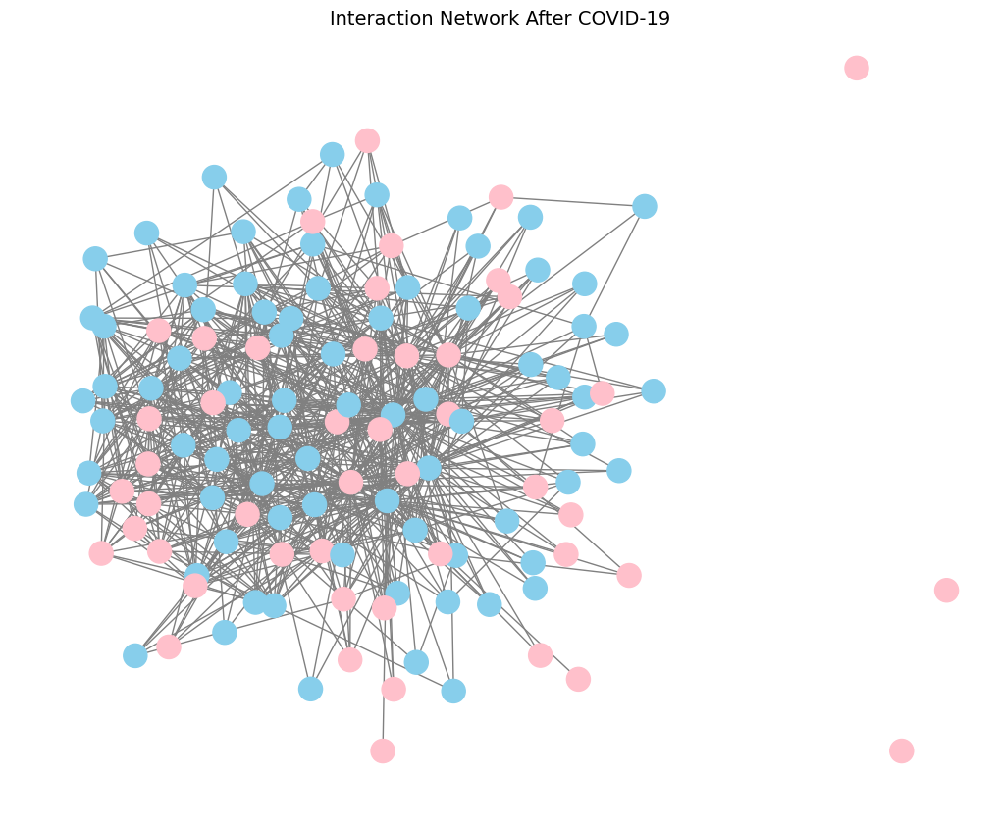

In [ ]:
#Visualizing the networks without names

# Import required libraries (already imported in your code, but listed for completeness)
import networkx as nx
import matplotlib.pyplot as plt
import pygraphviz
from networkx.drawing.nx_agraph import graphviz_layout

# Define a color mapping for gender
gender_colors = {'Male': 'skyblue', 'Female': 'pink'}

# Function to visualize and save a graph
def visualize_graph(graph, title, filename):
    plt.figure(figsize=(10, 8))  # Set figure size
    # Generate layout using neato program from PyGraphviz
    pos = graphviz_layout(graph, prog='neato')

    # Get node colors based on gender
    node_colors = [gender_colors[graph.nodes[node]['Gender']] for node in graph.nodes()]

    # Draw the graph
    nx.draw(graph, pos, node_color=node_colors, with_labels=False, node_size=300, edge_color='gray')

    # Add a title
    plt.title(title, fontsize=14)

    # Save the figure
    plt.savefig(filename, dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()

# Visualize the three graphs
visualize_graph(student_graph_before_covid, "Interaction Network Before COVID-19", "before_covid_network.png")
print("\n\n")
visualize_graph(student_graph_during_covid, "Interaction Network During COVID-19", "during_covid_network.png")
print("\n\n")
visualize_graph(student_graph_after_covid, "Interaction Network After COVID-19", "after_covid_network.png")

**NORMALIZED DEGREE DISTRIBUTIONS**

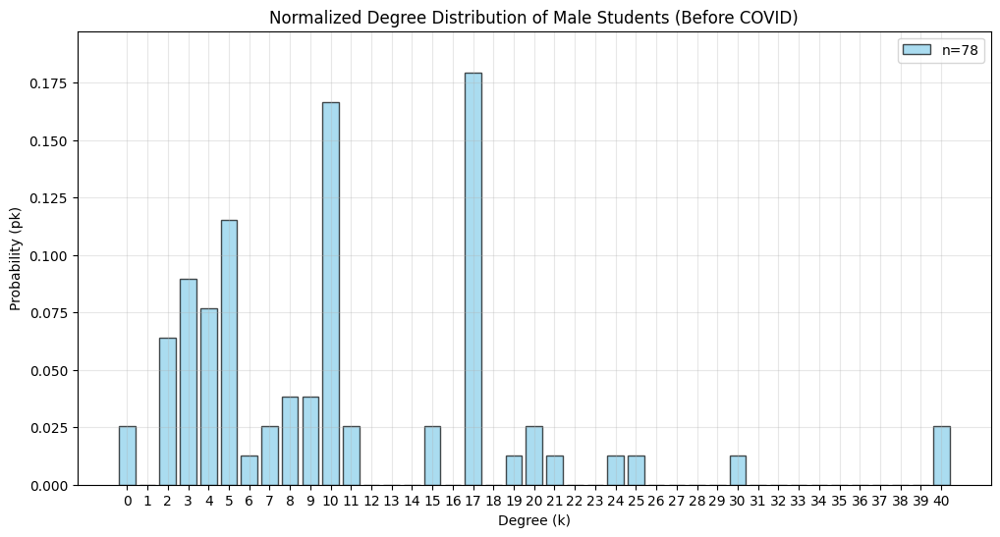

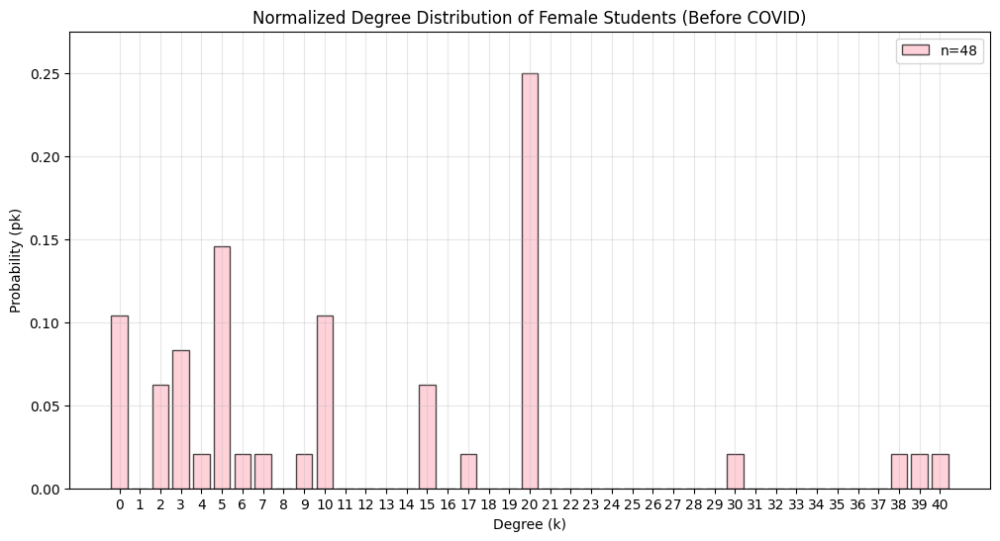

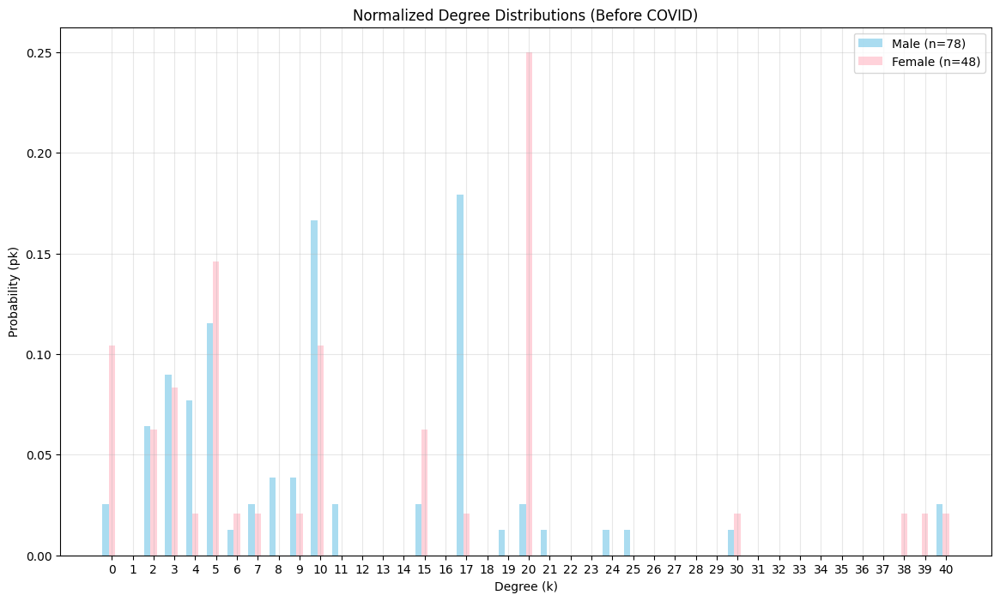

In [ ]:
#NORMALISED DEGREE DISTRIBUTION - BASED ON GENDER (BEFORE COVID)
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

# Step 1: Calculate degrees and separate by gender
degrees_before_covid = {n: student_graph_before_covid.degree(n) for n in student_graph_before_covid.nodes()}
gender_degrees_before_covid = {'Male': [], 'Female': []}

for node, attrs in student_graph_before_covid.nodes(data=True):
    gender = attrs['Gender']
    gender_degrees_before_covid[gender].append(degrees_before_covid[node])

# Step 2: Calculate degree distributions by gender
max_degree_before_covid = max(degrees_before_covid.values())
degree_range_before_covid = range(max_degree_before_covid + 1)

# Function to calculate degree distribution (probability)
def calculate_pk(degree_list):
    n_total = len(degree_list)
    if n_total == 0:
        return [0] * (max_degree_before_covid + 1)

    # Count nodes with each degree
    degree_counts = {}
    for d in degree_range_before_covid:
        degree_counts[d] = degree_list.count(d)

    # Calculate probability pk = Nk/N
    pk_values = [degree_counts.get(d, 0) / n_total for d in degree_range_before_covid]
    return pk_values

# Calculate pk for each gender
pk_male_before_covid = calculate_pk(gender_degrees_before_covid['Male'])
pk_female_before_covid = calculate_pk(gender_degrees_before_covid['Female'])

# Step 3: Plotting normalized degree distributions
# For male students
plt.figure(figsize=(12, 6))
plt.bar(degree_range_before_covid, pk_male_before_covid, alpha=0.7, color='skyblue', edgecolor='black', width=0.8,
       label=f"n={len(gender_degrees_before_covid['Male'])}")
plt.title('Normalized Degree Distribution of Male Students (Before COVID)')
plt.xlabel('Degree (k)')
plt.ylabel('Probability (pk)')
plt.xticks(degree_range_before_covid)
plt.ylim(0, max(pk_male_before_covid) * 1.1)  # Add some padding
plt.legend()
plt.grid(alpha=0.3)
plt.show()
print("\n\n")
# For female students
plt.figure(figsize=(12, 6))
plt.bar(degree_range_before_covid, pk_female_before_covid, alpha=0.7, color='pink', edgecolor='black', width=0.8,
       label=f"n={len(gender_degrees_before_covid['Female'])}")
plt.title('Normalized Degree Distribution of Female Students (Before COVID)')
plt.xlabel('Degree (k)')
plt.ylabel('Probability (pk)')
plt.xticks(degree_range_before_covid)
plt.ylim(0, max(pk_female_before_covid) * 1.1)  # Add some padding
plt.legend()
plt.grid(alpha=0.3)
plt.show()
print("\n\n")

# Optional: Plot all distributions together for comparison
plt.figure(figsize=(14, 8))
plt.bar([x-0.3 for x in degree_range_before_covid], pk_male_before_covid, alpha=0.7, color='skyblue',
       width=0.3, label=f"Male (n={len(gender_degrees_before_covid['Male'])})")
plt.bar([x for x in degree_range_before_covid], pk_female_before_covid, alpha=0.7, color='pink',
       width=0.3, label=f"Female (n={len(gender_degrees_before_covid['Female'])})")
plt.title('Normalized Degree Distributions (Before COVID)')
plt.xlabel('Degree (k)')
plt.ylabel('Probability (pk)')
plt.xticks(degree_range_before_covid)
plt.legend()
plt.grid(alpha=0.3)
plt.show()
print("\n\n")

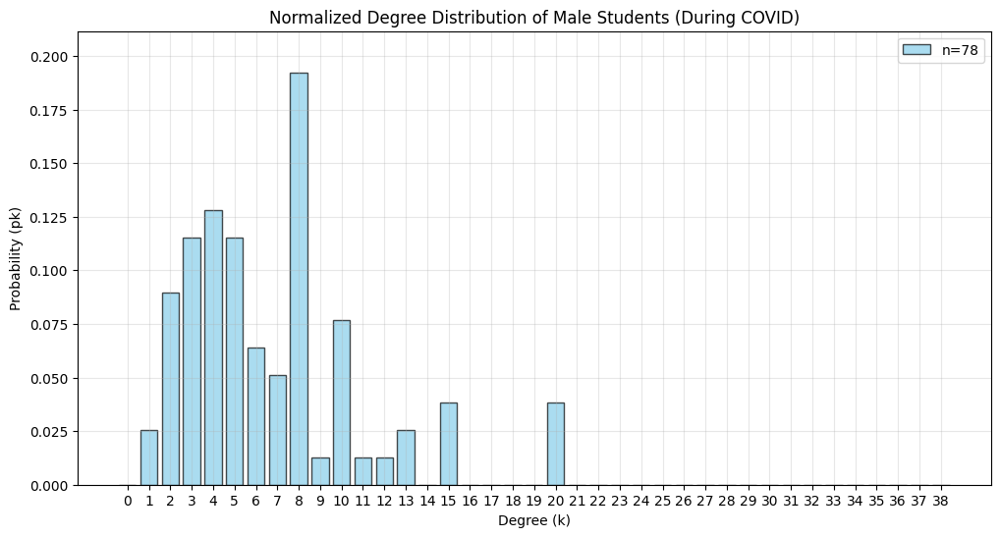

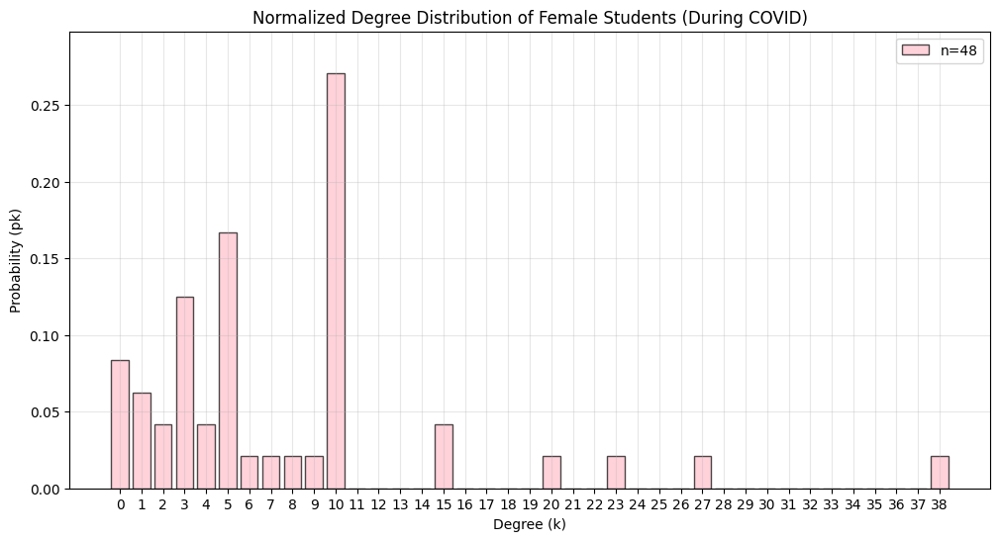

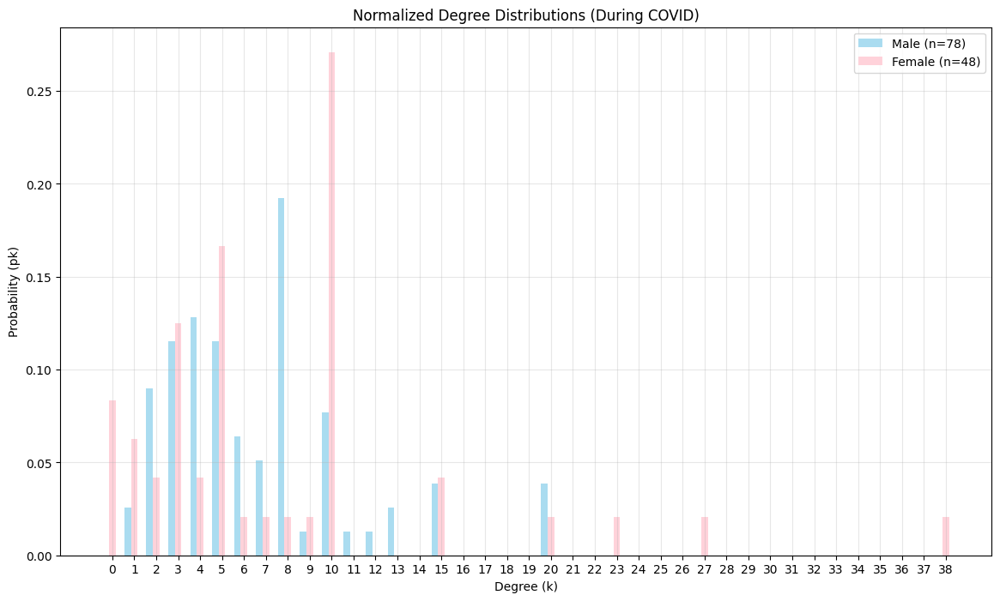

In [ ]:
#NORMALISED DEGREE DISTRIBUTION - BASED ON GENDER (DURING COVID)
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

# Step 1: Calculate degrees and separate by gender
degrees_during_covid = {n: student_graph_during_covid.degree(n) for n in student_graph_during_covid.nodes()}
gender_degrees_during_covid = {'Male': [], 'Female': []}

for node, attrs in student_graph_during_covid.nodes(data=True):
    gender = attrs['Gender']
    gender_degrees_during_covid[gender].append(degrees_during_covid[node])

# Step 2: Calculate degree distributions by gender
max_degree_during_covid = max(degrees_during_covid.values())
degree_range_during_covid = range(max_degree_during_covid + 1)

# Function to calculate degree distribution (probability)
def calculate_pk(degree_list):
    n_total = len(degree_list)
    if n_total == 0:
        return [0] * (max_degree_during_covid + 1)

    # Count nodes with each degree
    degree_counts = {}
    for d in degree_range_during_covid:
        degree_counts[d] = degree_list.count(d)

    # Calculate probability pk = Nk/N
    pk_values = [degree_counts.get(d, 0) / n_total for d in degree_range_during_covid]
    return pk_values

# Calculate pk for each gender
pk_male_during_covid = calculate_pk(gender_degrees_during_covid['Male'])
pk_female_during_covid = calculate_pk(gender_degrees_during_covid['Female'])

# Step 3: Plotting normalized degree distributions
# For male students
plt.figure(figsize=(12, 6))
plt.bar(degree_range_during_covid, pk_male_during_covid, alpha=0.7, color='skyblue', edgecolor='black', width=0.8,
       label=f"n={len(gender_degrees_during_covid['Male'])}")
plt.title('Normalized Degree Distribution of Male Students (During COVID)')
plt.xlabel('Degree (k)')
plt.ylabel('Probability (pk)')
plt.xticks(degree_range_during_covid)
plt.ylim(0, max(pk_male_during_covid) * 1.1)  # Add some padding
plt.legend()
plt.grid(alpha=0.3)
plt.show()
print("\n\n")
# For female students
plt.figure(figsize=(12, 6))
plt.bar(degree_range_during_covid, pk_female_during_covid, alpha=0.7, color='pink', edgecolor='black', width=0.8,
       label=f"n={len(gender_degrees_during_covid['Female'])}")
plt.title('Normalized Degree Distribution of Female Students (During COVID)')
plt.xlabel('Degree (k)')
plt.ylabel('Probability (pk)')
plt.xticks(degree_range_during_covid)
plt.ylim(0, max(pk_female_during_covid) * 1.1)  # Add some padding
plt.legend()
plt.grid(alpha=0.3)
plt.show()
print("\n\n")


# Optional: Plot all distributions together for comparison
plt.figure(figsize=(14, 8))
plt.bar([x-0.3 for x in degree_range_during_covid], pk_male_during_covid, alpha=0.7, color='skyblue',
       width=0.3, label=f"Male (n={len(gender_degrees_during_covid['Male'])})")
plt.bar([x for x in degree_range_during_covid], pk_female_during_covid, alpha=0.7, color='pink',
       width=0.3, label=f"Female (n={len(gender_degrees_during_covid['Female'])})")

plt.title('Normalized Degree Distributions (During COVID)')
plt.xlabel('Degree (k)')
plt.ylabel('Probability (pk)')
plt.xticks(degree_range_during_covid)
plt.legend()
plt.grid(alpha=0.3)
plt.show()


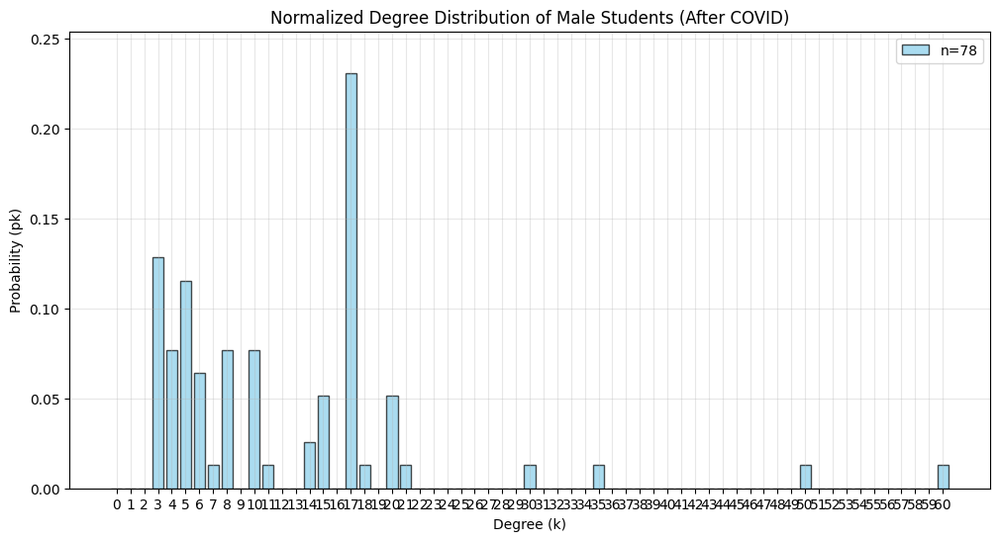

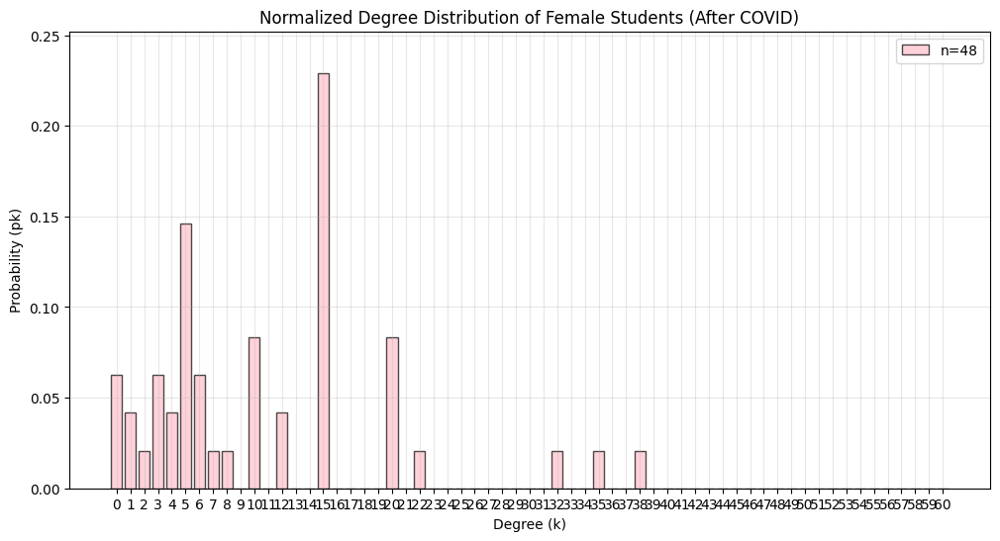

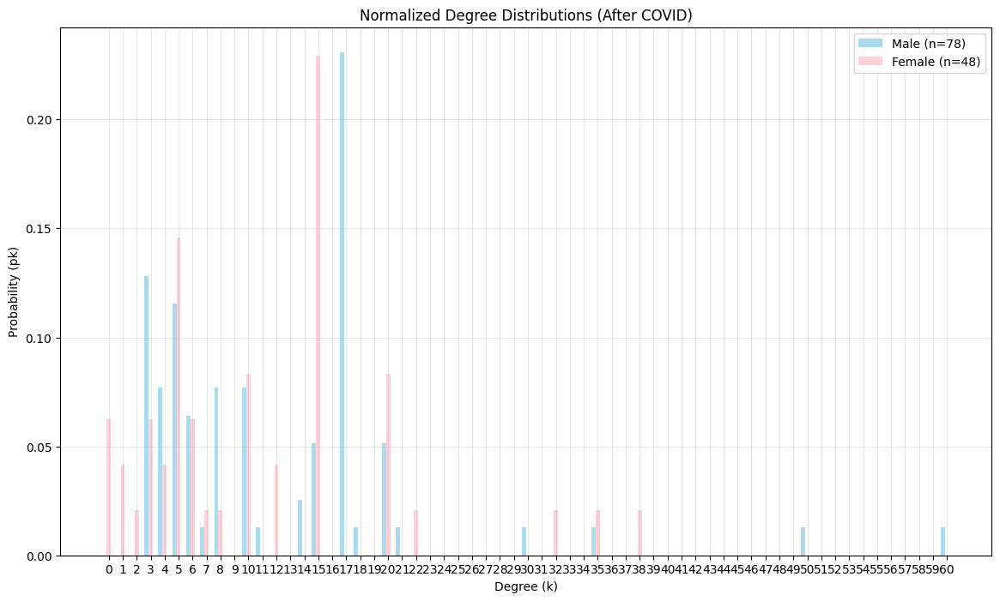

In [ ]:
#NORMALISED DEGREE DISTRIBUTION - BASED ON GENDER (AFTER COVID)
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

# Step 1: Calculate degrees and separate by gender
degrees_after_covid = {n: student_graph_after_covid.degree(n) for n in student_graph_after_covid.nodes()}
gender_degrees_after_covid = {'Male': [], 'Female': []}

for node, attrs in student_graph_after_covid.nodes(data=True):
    gender = attrs['Gender']
    gender_degrees_after_covid[gender].append(degrees_after_covid[node])

# Step 2: Calculate degree distributions by gender
max_degree_after_covid = max(degrees_after_covid.values())
degree_range_after_covid = range(max_degree_after_covid + 1)

# Function to calculate degree distribution (probability)
def calculate_pk(degree_list):
    n_total = len(degree_list)
    if n_total == 0:
        return [0] * (max_degree_after_covid + 1)

    # Count nodes with each degree
    degree_counts = {}
    for d in degree_range_after_covid:
        degree_counts[d] = degree_list.count(d)

    # Calculate probability pk = Nk/N
    pk_values = [degree_counts.get(d, 0) / n_total for d in degree_range_after_covid]
    return pk_values

# Calculate pk for each gender
pk_male_after_covid = calculate_pk(gender_degrees_after_covid['Male'])
pk_female_after_covid = calculate_pk(gender_degrees_after_covid['Female'])

# Step 3: Plotting normalized degree distributions
# For male students
plt.figure(figsize=(12, 6))
plt.bar(degree_range_after_covid, pk_male_after_covid, alpha=0.7, color='skyblue', edgecolor='black', width=0.8,
       label=f"n={len(gender_degrees_after_covid['Male'])}")
plt.title('Normalized Degree Distribution of Male Students (After COVID)')
plt.xlabel('Degree (k)')
plt.ylabel('Probability (pk)')
plt.xticks(degree_range_after_covid)
plt.ylim(0, max(pk_male_after_covid) * 1.1)  # Add some padding
plt.legend()
plt.grid(alpha=0.3)
plt.show()
print("\n")
# For female students
plt.figure(figsize=(12, 6))
plt.bar(degree_range_after_covid, pk_female_after_covid, alpha=0.7, color='pink', edgecolor='black', width=0.8,
       label=f"n={len(gender_degrees_after_covid['Female'])}")
plt.title('Normalized Degree Distribution of Female Students (After COVID)')
plt.xlabel('Degree (k)')
plt.ylabel('Probability (pk)')
plt.xticks(degree_range_after_covid)
plt.ylim(0, max(pk_female_after_covid) * 1.1)  # Add some padding
plt.legend()
plt.grid(alpha=0.3)
plt.show()
print("\n")

# Optional: Plot all distributions together for comparison
plt.figure(figsize=(14, 8))
plt.bar([x-0.3 for x in degree_range_after_covid], pk_male_after_covid, alpha=0.7, color='skyblue',
       width=0.3, label=f"Male (n={len(gender_degrees_after_covid['Male'])})")
plt.bar([x for x in degree_range_after_covid], pk_female_after_covid, alpha=0.7, color='pink',
       width= 0.3, label=f"Female (n={len(gender_degrees_after_covid['Female'])})")

plt.title('Normalized Degree Distributions (After COVID)')
plt.xlabel('Degree (k)')
plt.ylabel('Probability (pk)')
plt.xticks(degree_range_after_covid)
plt.legend()
plt.grid(alpha=0.3)
plt.show()

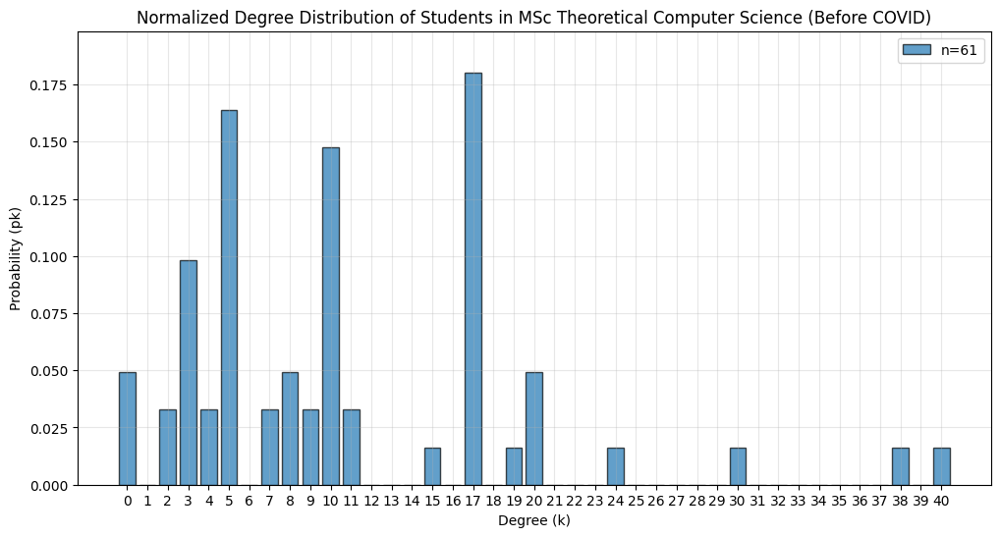

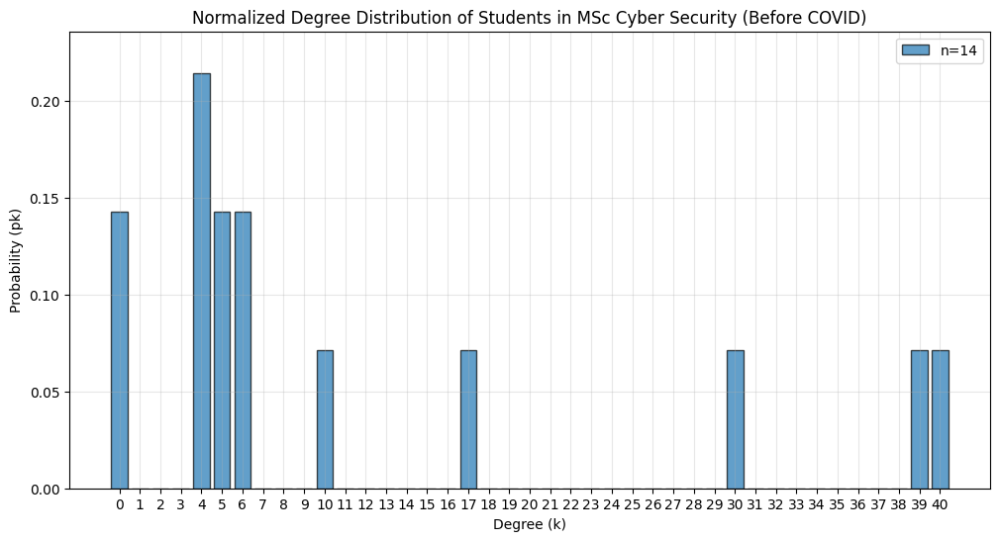

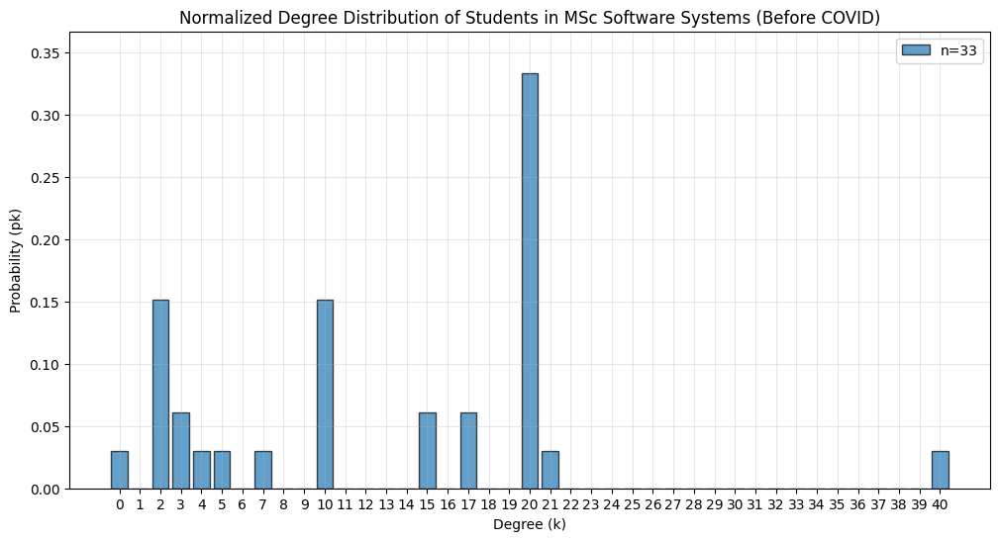

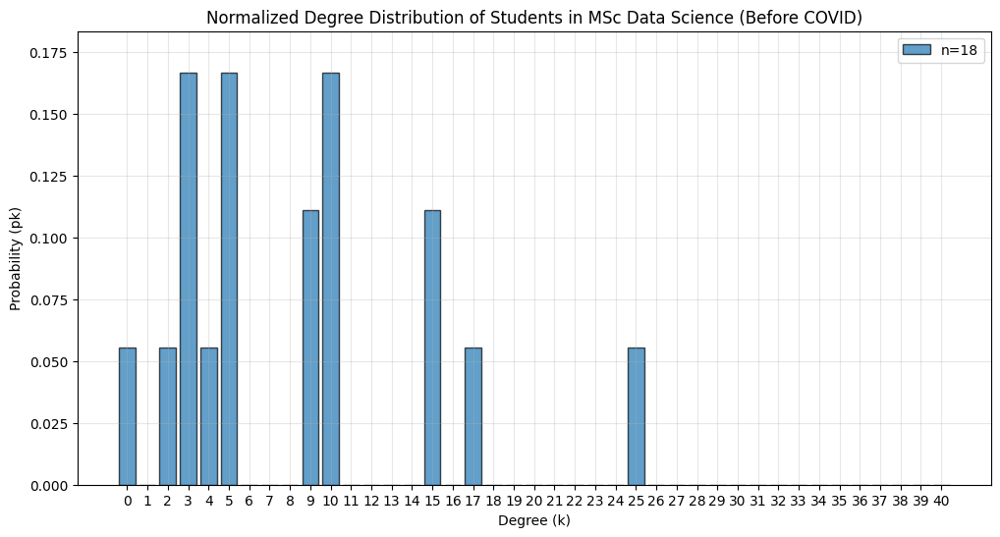

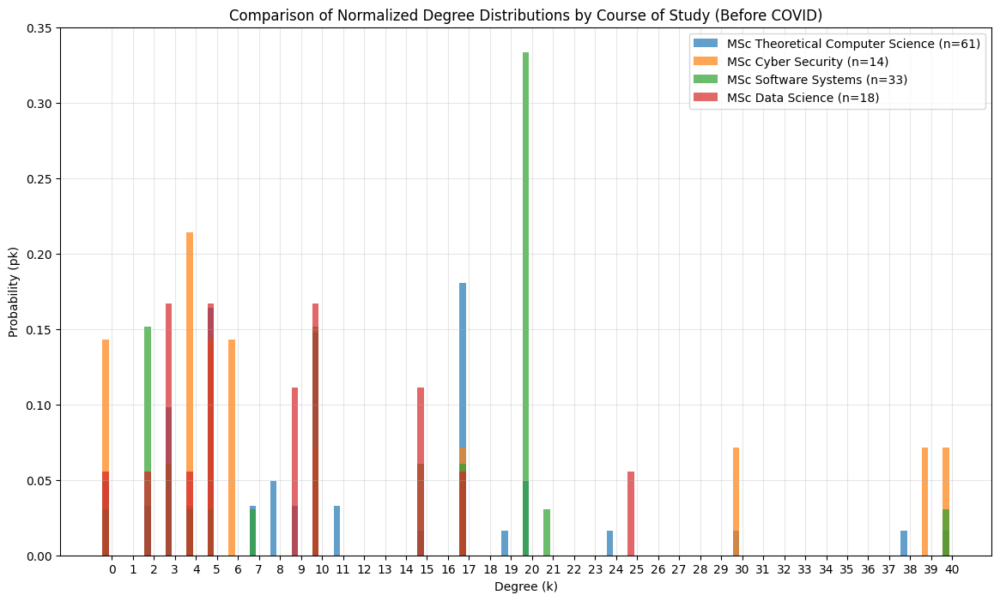

In [ ]:
#NORMALISED DEGREE DISTRIBUTION - BASED ON COURSE(BEFORE COVID)
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

# Step 1: Calculate degrees and separate by course of study
degrees_before_covid = {n: student_graph_before_covid.degree(n) for n in student_graph_before_covid.nodes()}
course_degrees_before_covid = {}

for node, attrs in student_graph_before_covid.nodes(data=True):
    course = attrs['Course of Study']  # Assuming 'Course of Study' is the attribute name
    if course not in course_degrees_before_covid:
        course_degrees_before_covid[course] = []
    course_degrees_before_covid[course].append(degrees_before_covid[node])

# Step 2: Calculate degree distributions by course of study
max_degree_before_covid = max(degrees_before_covid.values())
degree_range_before_covid = range(max_degree_before_covid + 1)

# Function to calculate degree distribution (probability)
def calculate_pk(degree_list):
    n_total = len(degree_list)
    if n_total == 0:
        return [0] * (max_degree_before_covid + 1)

    # Count nodes with each degree
    degree_counts = {}
    for d in degree_range_before_covid:
        degree_counts[d] = degree_list.count(d)

    # Calculate probability pk = Nk/N
    pk_values = [degree_counts.get(d, 0) / n_total for d in degree_range_before_covid]
    return pk_values

# Calculate pk for each course of study
pk_courses_before_covid = {}
for course, degrees in course_degrees_before_covid.items():
    pk_courses_before_covid[course] = calculate_pk(degrees)

# Step 3: Plotting normalized degree distributions for each course of study
for course, pk_values in pk_courses_before_covid.items():
    plt.figure(figsize=(12, 6))
    plt.bar(degree_range_before_covid, pk_values, alpha=0.7, edgecolor='black', width=0.8,
            label=f"n={len(course_degrees_before_covid[course])}")
    plt.title(f'Normalized Degree Distribution of Students in {course} (Before COVID)')
    plt.xlabel('Degree (k)')
    plt.ylabel('Probability (pk)')
    plt.xticks(degree_range_before_covid)
    plt.ylim(0, max(pk_values) * 1.1)  # Add some padding
    plt.legend()
    plt.grid(alpha=0.3)
    plt.show()
    print("\n")

print("\n")
# Optional: Plot all distributions together for comparison
plt.figure(figsize=(14, 8))
for course, pk_values in pk_courses_before_covid.items():
    plt.bar([x - 0.3 for x in degree_range_before_covid], pk_values, alpha=0.7, width=0.3,
            label=f"{course} (n={len(course_degrees_before_covid[course])})")
plt.title('Comparison of Normalized Degree Distributions by Course of Study (Before COVID)')
plt.xlabel('Degree (k)')
plt.ylabel('Probability (pk)')
plt.xticks(degree_range_before_covid)
plt.legend()
plt.grid(alpha=0.3)
plt.show()

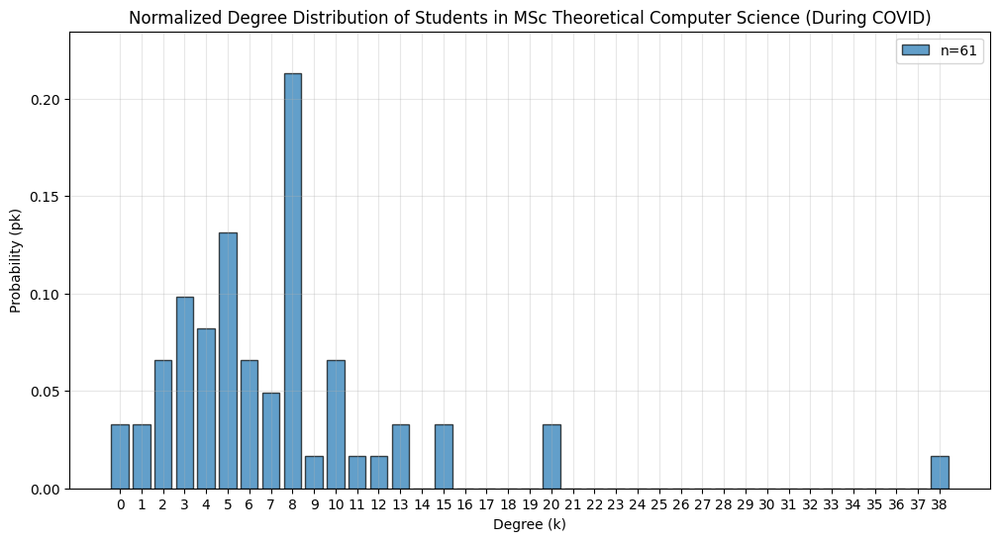

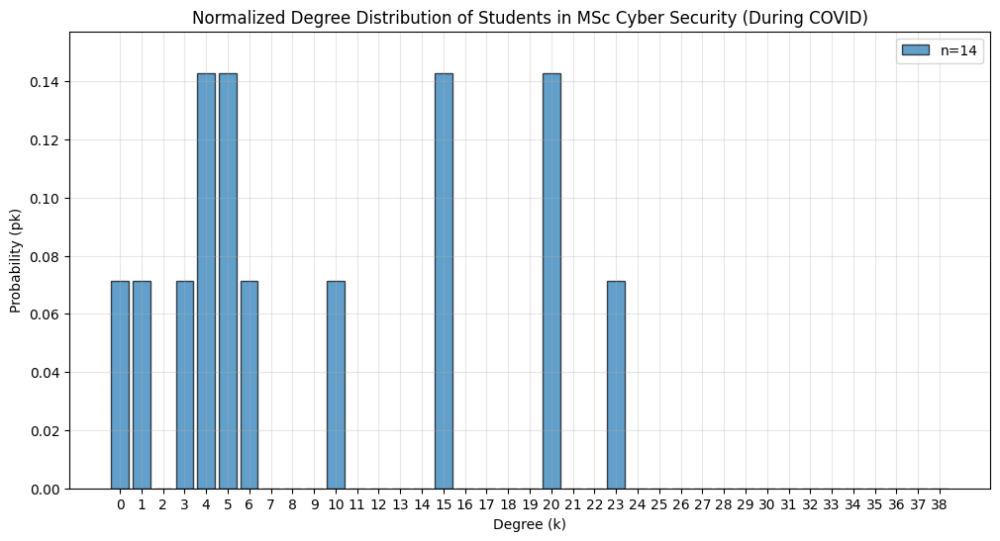

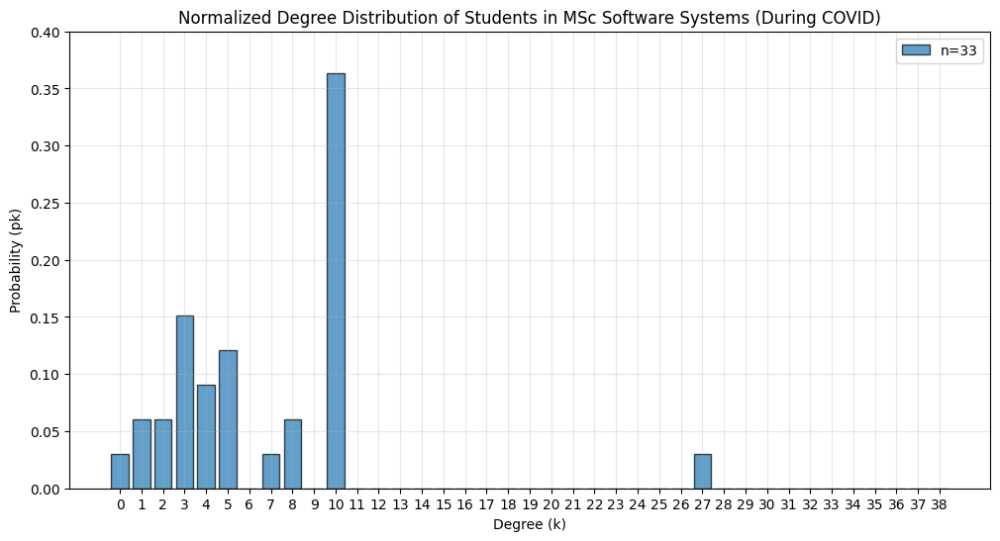

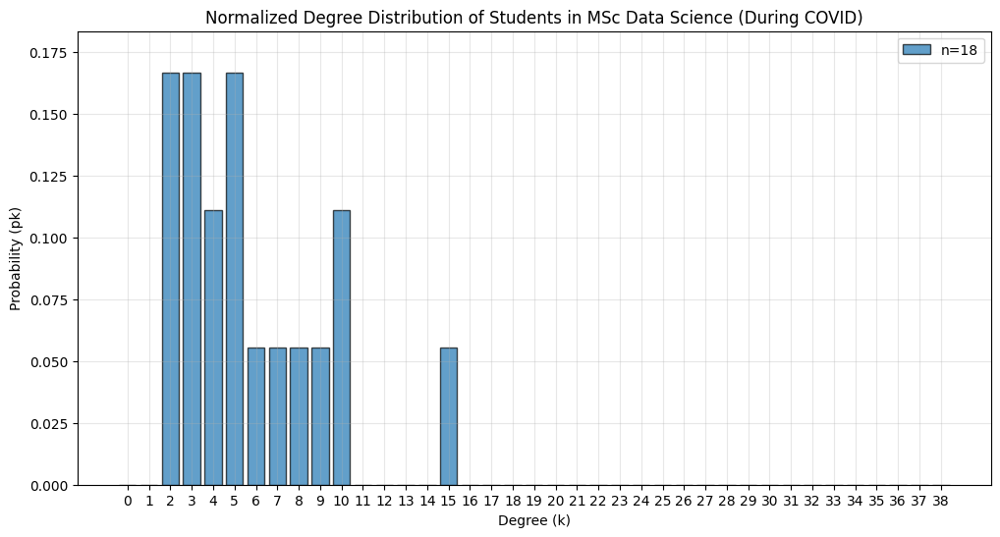

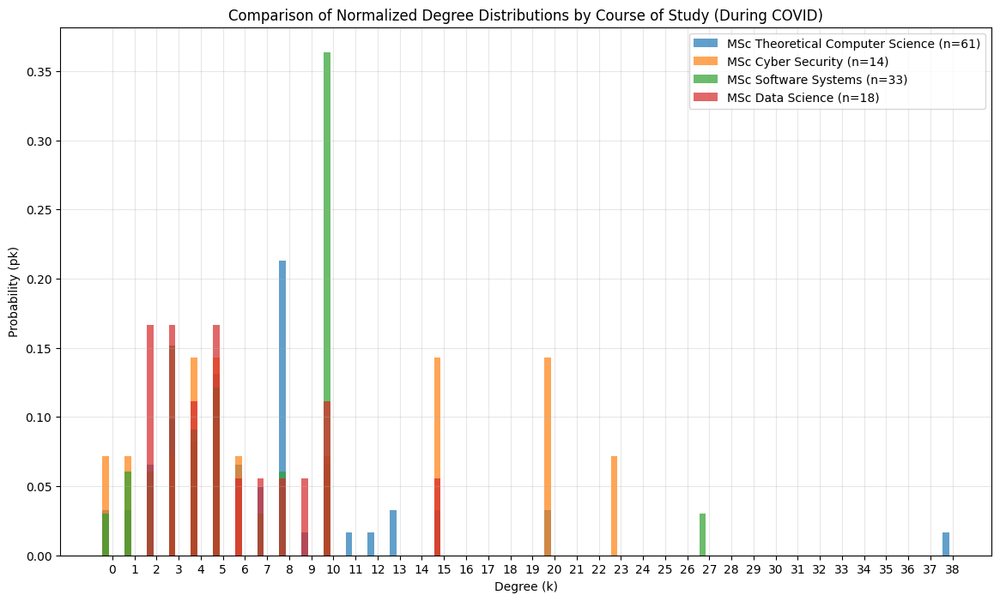

In [ ]:
#NORMALISED DEGREE DISTRIBUTION - BASED ON COURSE(DURING COVID)

# Step 1: Calculate degrees and separate by course of study during COVID
degrees_during_covid = {n: student_graph_during_covid.degree(n) for n in student_graph_during_covid.nodes()}
course_degrees_during_covid = {}

for node, attrs in student_graph_during_covid.nodes(data=True):
    course = attrs['Course of Study']  # Assuming 'Course of Study' is the attribute name
    if course not in course_degrees_during_covid:
        course_degrees_during_covid[course] = []
    course_degrees_during_covid[course].append(degrees_during_covid[node])

# Step 2: Calculate degree distributions by course of study
max_degree_during_covid = max(degrees_during_covid.values())
degree_range_during_covid = range(max_degree_during_covid + 1)

# Function to calculate degree distribution (probability)
def calculate_pk(degree_list):
    n_total = len(degree_list)
    if n_total == 0:
        return [0] * (max_degree_during_covid + 1)

    # Count nodes with each degree
    degree_counts = {}
    for d in degree_range_during_covid:
        degree_counts[d] = degree_list.count(d)

    # Calculate probability pk = Nk/N
    pk_values = [degree_counts.get(d, 0) / n_total for d in degree_range_during_covid]
    return pk_values

# Calculate pk for each course of study
pk_courses_during_covid = {}
for course, degrees in course_degrees_during_covid.items():
    pk_courses_during_covid[course] = calculate_pk(degrees)

# Step 3: Plotting normalized degree distributions for each course of study during COVID
for course, pk_values in pk_courses_during_covid.items():
    plt.figure(figsize=(12, 6))
    plt.bar(degree_range_during_covid, pk_values, alpha=0.7, edgecolor='black', width=0.8,
            label=f"n={len(course_degrees_during_covid[course])}")
    plt.title(f'Normalized Degree Distribution of Students in {course} (During COVID)')
    plt.xlabel('Degree (k)')
    plt.ylabel('Probability (pk)')
    plt.xticks(degree_range_during_covid)
    plt.ylim(0, max(pk_values) * 1.1)  # Add some padding
    plt.legend()
    plt.grid(alpha=0.3)
    plt.show()
    print("\n")

print("\n")
# Optional: Plot all distributions together for comparison
plt.figure(figsize=(14, 8))
for course, pk_values in pk_courses_during_covid.items():
    plt.bar([x - 0.3 for x in degree_range_during_covid], pk_values, alpha=0.7, width=0.3,
            label=f"{course} (n={len(course_degrees_during_covid[course])})")
plt.title('Comparison of Normalized Degree Distributions by Course of Study (During COVID)')
plt.xlabel('Degree (k)')
plt.ylabel('Probability (pk)')
plt.xticks(degree_range_during_covid)
plt.legend()
plt.grid(alpha=0.3)
plt.show()

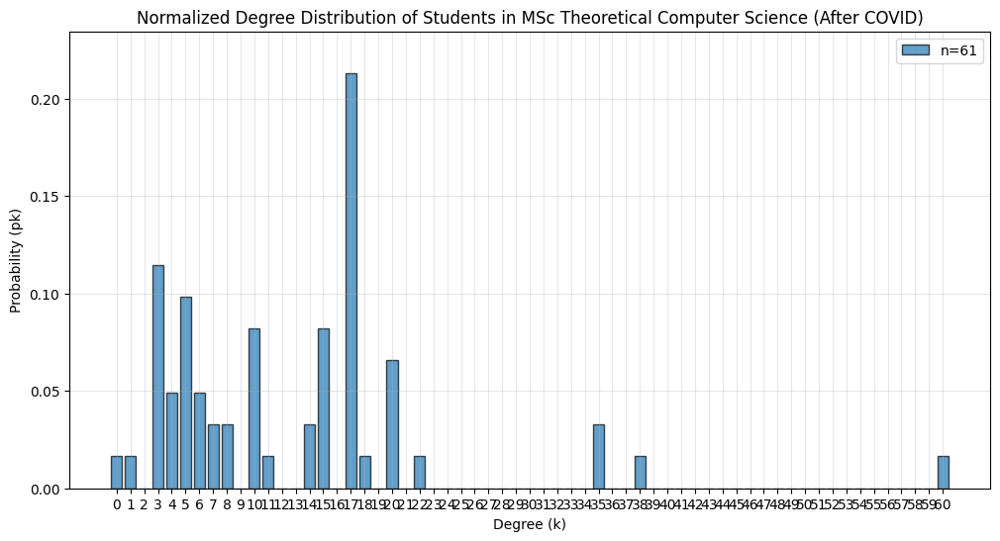

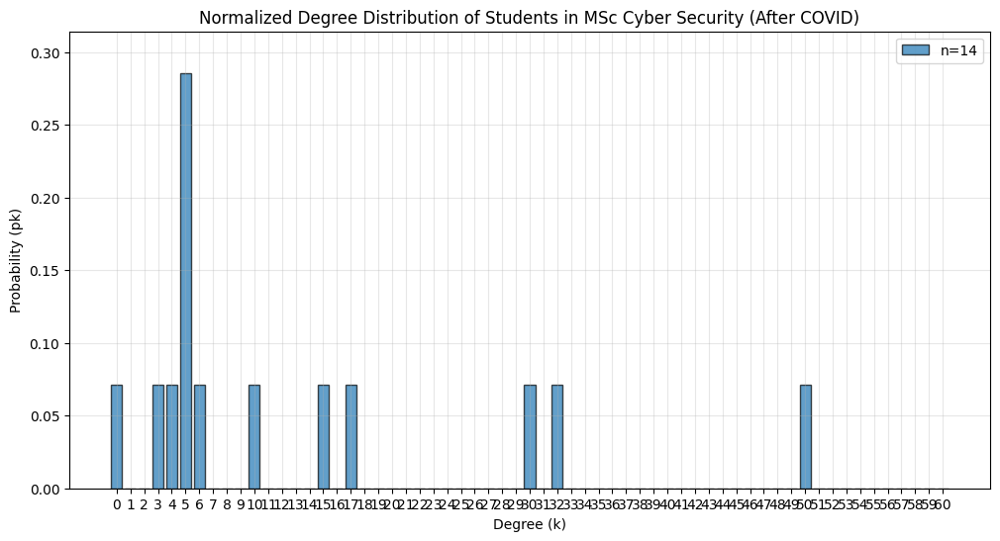

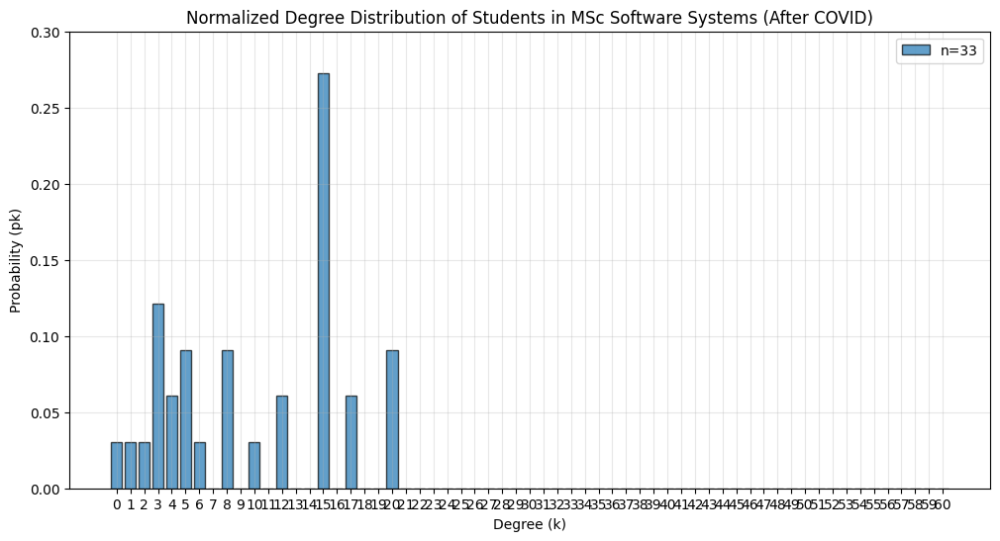

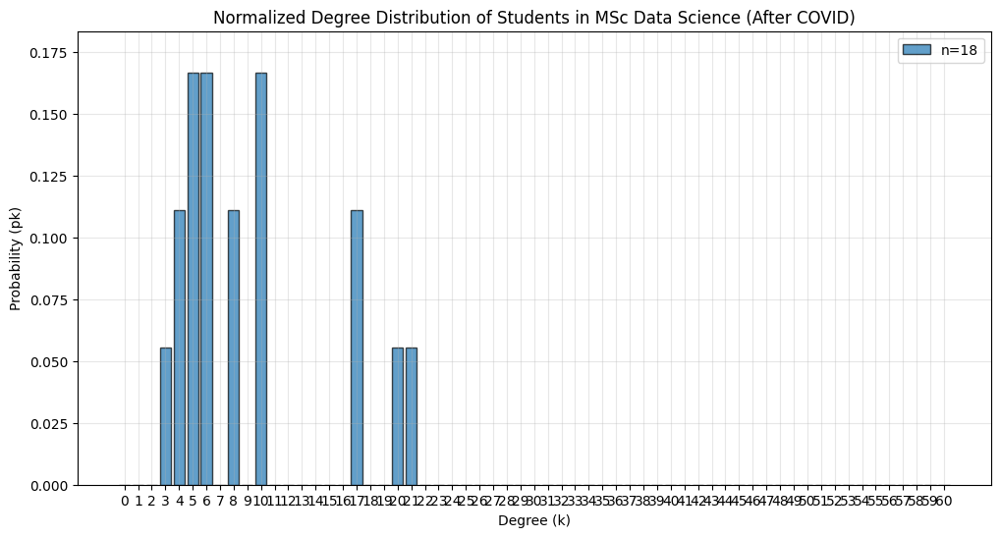

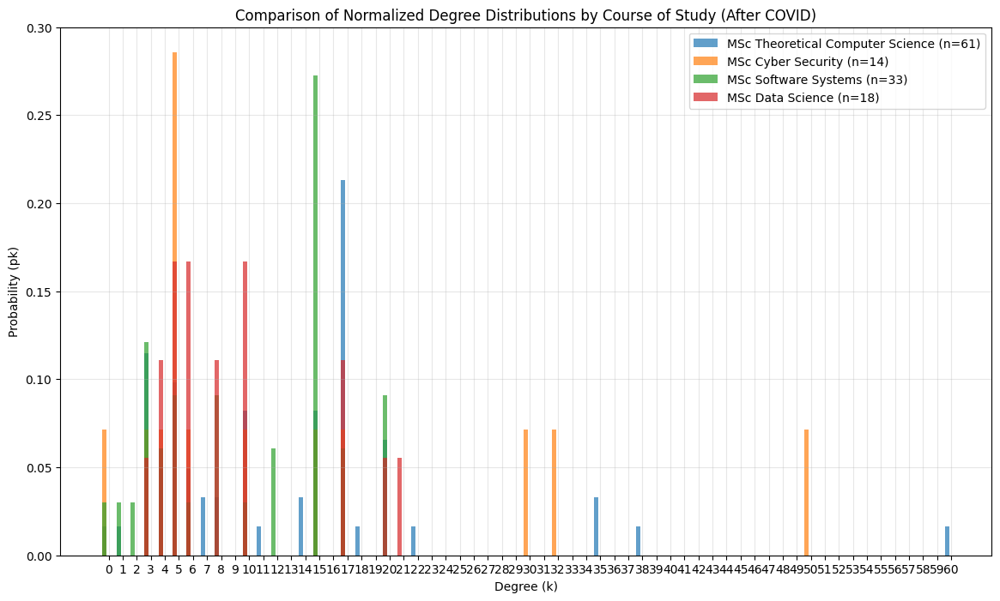

In [ ]:
#NORMALISED DEGREE DISTRIBUTION - BASED ON COURSE(AFTER COVID)

# Step 1: Calculate degrees and separate by course of study after COVID
degrees_after_covid = {n: student_graph_after_covid.degree(n) for n in student_graph_after_covid.nodes()}
course_degrees_after_covid = {}

for node, attrs in student_graph_after_covid.nodes(data=True):
    course = attrs['Course of Study']  # Assuming 'Course of Study' is the attribute name
    if course not in course_degrees_after_covid:
        course_degrees_after_covid[course] = []
    course_degrees_after_covid[course].append(degrees_after_covid[node])

# Step 2: Calculate degree distributions by course of study
max_degree_after_covid = max(degrees_after_covid.values())
degree_range_after_covid = range(max_degree_after_covid + 1)

# Function to calculate degree distribution (probability)
def calculate_pk(degree_list):
    n_total = len(degree_list)
    if n_total == 0:
        return [0] * (max_degree_after_covid + 1)

    # Count nodes with each degree
    degree_counts = {}
    for d in degree_range_after_covid:
        degree_counts[d] = degree_list.count(d)

    # Calculate probability pk = Nk/N
    pk_values = [degree_counts.get(d, 0) / n_total for d in degree_range_after_covid]
    return pk_values

# Calculate pk for each course of study
pk_courses_after_covid = {}
for course, degrees in course_degrees_after_covid.items():
    pk_courses_after_covid[course] = calculate_pk(degrees)

# Step 3: Plotting normalized degree distributions for each course of study after COVID
for course, pk_values in pk_courses_after_covid.items():
    plt.figure(figsize=(12, 6))
    plt.bar(degree_range_after_covid, pk_values, alpha=0.7, edgecolor='black', width=0.8,
            label=f"n={len(course_degrees_after_covid[course])}")
    plt.title(f'Normalized Degree Distribution of Students in {course} (After COVID)')
    plt.xlabel('Degree (k)')
    plt.ylabel('Probability (pk)')
    plt.xticks(degree_range_after_covid)
    plt.ylim(0, max(pk_values) * 1.1)  # Add some padding
    plt.legend()
    plt.grid(alpha=0.3)
    plt.show()
    print("\n")

print("\n")

# Optional: Plot all distributions together for comparison
plt.figure(figsize=(14, 8))
for course, pk_values in pk_courses_after_covid.items():
    plt.bar([x - 0.3 for x in degree_range_after_covid], pk_values, alpha=0.7, width=0.3,
            label=f"{course} (n={len(course_degrees_after_covid[course])})")
plt.title('Comparison of Normalized Degree Distributions by Course of Study (After COVID)')
plt.xlabel('Degree (k)')
plt.ylabel('Probability (pk)')
plt.xticks(degree_range_after_covid)
plt.legend()
plt.grid(alpha=0.3)
plt.show()

**CORRELATION COEFFICIENT**

In [ ]:
#CORRELATION COEFFICIENT - ALL STUDENTS

import numpy as np
from scipy.stats import pearsonr

# Create a common degree range that includes all possible degrees
max_degree = max(max(degree_range_before_covid), max(degree_range_during_covid), max(degree_range_after_covid))
common_degree_range = range(max_degree + 1)

# Function to align pk values to a common degree range
def align_pk_to_common_range(pk_values, common_range):
    aligned_pk = [0] * (len(common_range))  # Initialize with zeros
    for degree in range(len(pk_values)):
        if degree < len(aligned_pk):  # Ensure we don't go out of bounds
            aligned_pk[degree] = pk_values[degree]  # Fill in the pk values at the corresponding degree
    return aligned_pk

# Assuming you have already calculated pk values for all students
# Combine pk values for all students (not separating by gender)
pk_all_students_before = pk_male_before_covid + pk_female_before_covid  # Combine if you have separate pk values
pk_all_students_during = pk_male_during_covid + pk_female_during_covid  # Combine if you have separate pk values
pk_all_students_after = pk_male_after_covid + pk_female_after_covid  # Combine if you have separate pk values

# Align pk values for all students
pk_all_students_before_aligned = align_pk_to_common_range(pk_all_students_before, common_degree_range)
pk_all_students_during_aligned = align_pk_to_common_range(pk_all_students_during, common_degree_range)
pk_all_students_after_aligned = align_pk_to_common_range(pk_all_students_after, common_degree_range)

# Calculate correlation coefficients using aligned pk values for all students
correlation_all_students_before_during = pearsonr(pk_all_students_before_aligned, pk_all_students_during_aligned)[0]
correlation_all_students_during_after = pearsonr(pk_all_students_during_aligned, pk_all_students_after_aligned)[0]
correlation_all_students_before_after = pearsonr(pk_all_students_before_aligned, pk_all_students_after_aligned)[0]

# Print the correlation coefficients for all students
print("ALL STUDENTS ANALYSIS: ")
print(f"Correlation coefficient for All students (Before vs During): {correlation_all_students_before_during:.4f}")
print(f"Correlation coefficient for All students (During vs After): {correlation_all_students_during_after:.4f}")
print(f"Correlation coefficient for All students (Before vs After): {correlation_all_students_before_after:.4f}")

ALL STUDENTS ANALYSIS: 
Correlation coefficient for All students (Before vs During): 0.2684
Correlation coefficient for All students (During vs After): 0.2735
Correlation coefficient for All students (Before vs After): 0.6263


In [ ]:
#CORRELATION COEFFICIENT (GENDER WISE)

import numpy as np
from scipy.stats import pearsonr

# Create a common degree range that includes all possible degrees
max_degree = max(max(degree_range_before_covid), max(degree_range_during_covid), max(degree_range_after_covid))
common_degree_range = range(max_degree + 1)

# Function to align pk values to a common degree range
def align_pk_to_common_range(pk_values, common_range):
    aligned_pk = [0] * (max(common_range) + 1)  # Initialize with zeros
    for degree, pk in zip(range(len(pk_values)), pk_values):
        aligned_pk[degree] = pk  # Fill in the pk values at the corresponding degree
    return aligned_pk

# Align pk values for each gender and time period
pk_male_before_aligned = align_pk_to_common_range(pk_male_before_covid, common_degree_range)
pk_male_during_aligned = align_pk_to_common_range(pk_male_during_covid, common_degree_range)
pk_male_after_aligned = align_pk_to_common_range(pk_male_after_covid, common_degree_range)

pk_female_before_aligned = align_pk_to_common_range(pk_female_before_covid, common_degree_range)
pk_female_during_aligned = align_pk_to_common_range(pk_female_during_covid, common_degree_range)
pk_female_after_aligned = align_pk_to_common_range(pk_female_after_covid, common_degree_range)


# Calculate correlation coefficients using aligned pk values
correlation_male_before_during = pearsonr(pk_male_before_aligned, pk_male_during_aligned)[0]
correlation_male_during_after = pearsonr(pk_male_during_aligned, pk_male_after_aligned)[0]
correlation_male_before_after = pearsonr(pk_male_before_aligned, pk_male_after_aligned)[0]

correlation_female_before_during = pearsonr(pk_female_before_aligned, pk_female_during_aligned)[0]
correlation_female_during_after = pearsonr(pk_female_during_aligned, pk_female_after_aligned)[0]
correlation_female_before_after = pearsonr(pk_female_before_aligned, pk_female_after_aligned)[0]


# Print the correlation coefficients
print("MALE STUDENTS ANALYSIS: ")
print(f"Correlation coefficient for Male students (Before vs During): {correlation_male_before_during:.4f}")
print(f"Correlation coefficient for Male students (During vs After): {correlation_male_during_after:.4f}")
print(f"Correlation coefficient for Male students (Before vs After): {correlation_male_before_after:.4f}")

print("\n\nFEMALE STUDENTS ANALYSIS")
print(f"Correlation coefficient for Female students (Before vs During): {correlation_female_before_during:.4f}")
print(f"Correlation coefficient for Female students (During vs After): {correlation_female_during_after:.4f}")
print(f"Correlation coefficient for Female students (Before vs After): {correlation_female_before_after:.4f}")


MALE STUDENTS ANALYSIS: 
Correlation coefficient for Male students (Before vs During): 0.5589
Correlation coefficient for Male students (During vs After): 0.5539
Correlation coefficient for Male students (Before vs After): 0.8531


FEMALE STUDENTS ANALYSIS
Correlation coefficient for Female students (Before vs During): 0.6004
Correlation coefficient for Female students (During vs After): 0.5985
Correlation coefficient for Female students (Before vs After): 0.6533


In [ ]:
#CORRELATION COEFFICIENT (COURSE WISE)
import numpy as np
from scipy.stats import pearsonr

# Create a common degree range that includes all possible degrees
max_degree = max(max(degree_range_before_covid), max(degree_range_during_covid), max(degree_range_after_covid))
common_degree_range = range(max_degree + 1)

# Function to align pk values to a common degree range
def align_pk_to_common_range(pk_values, common_range):
    aligned_pk = [0] * (max(common_range) + 1)  # Initialize with zeros
    for degree, pk in zip(range(len(pk_values)), pk_values):
        aligned_pk[degree] = pk  # Fill in the pk values at the corresponding degree
    return aligned_pk

# Align pk values for each course of study before, during, and after COVID
pk_courses_before_aligned = {course: align_pk_to_common_range(pk_courses_before_covid[course], common_degree_range) for course in pk_courses_before_covid}
pk_courses_during_aligned = {course: align_pk_to_common_range(pk_courses_during_covid[course], common_degree_range) for course in pk_courses_during_covid}
pk_courses_after_aligned = {course: align_pk_to_common_range(pk_courses_after_covid[course], common_degree_range) for course in pk_courses_after_covid}

# Calculate correlation coefficients for each course of study
correlation_courses = {}
for course in pk_courses_before_covid.keys():
    correlation_before_during = pearsonr(pk_courses_before_aligned[course], pk_courses_during_aligned[course])[0]
    correlation_during_after = pearsonr(pk_courses_during_aligned[course], pk_courses_after_aligned[course])[0]
    correlation_before_after = pearsonr(pk_courses_before_aligned[course], pk_courses_after_aligned[course])[0]

    correlation_courses[course] = {
        'Before vs During': correlation_before_during,
        'During vs After': correlation_during_after,
        'Before vs After': correlation_before_after
    }

# Print the correlation coefficients for each course of study
for course, correlations in correlation_courses.items():
    print(f"Course of Study: {course}")
    print(f"  Correlation coefficient (Before vs During): {correlations['Before vs During']:.4f}")
    print(f"  Correlation coefficient (During vs After): {correlations['During vs After']:.4f}")
    print(f"  Correlation coefficient (Before vs After): {correlations['Before vs After']:.4f}")
    print()

Course of Study: MSc Theoretical Computer Science
  Correlation coefficient (Before vs During): 0.5374
  Correlation coefficient (During vs After): 0.4301
  Correlation coefficient (Before vs After): 0.8518

Course of Study: MSc Cyber Security
  Correlation coefficient (Before vs During): 0.5697
  Correlation coefficient (During vs After): 0.6180
  Correlation coefficient (Before vs After): 0.6489

Course of Study: MSc Software Systems
  Correlation coefficient (Before vs During): 0.3934
  Correlation coefficient (During vs After): 0.2812
  Correlation coefficient (Before vs After): 0.4212

Course of Study: MSc Data Science
  Correlation coefficient (Before vs During): 0.7982
  Correlation coefficient (During vs After): 0.6080
  Correlation coefficient (Before vs After): 0.5519



**CENTRALITY MEASURES**

In [ ]:
#Finding the influential nodes in a network (BEFORE COVID)


#DEGREE CENTRALITY

degree_centrality = nx.degree_centrality(student_graph_before_covid)
most_influential_degree = max(degree_centrality, key=degree_centrality.get)

print("MOST INFLUENTIAL NODE - USING DEGREE CENTRALITY:")
print(f"Name:",most_influential_degree)
degree_node_properties = student_graph_before_covid.nodes[most_influential_degree]
print(f"Degree Centrality:", degree_centrality[most_influential_degree])
print(f"Year of study:", degree_node_properties['Year of Study'])

print("\n\n------------------------------------------------------------------------\n\n")

#BETWEENNESS CENTRALITY

betweenness_centrality = nx.betweenness_centrality(student_graph_before_covid)
most_influential_betweenness = max(betweenness_centrality, key=betweenness_centrality.get)

print("MOST INFLUENTIAL NODE - USING BETWEENNESS CENTRALITY:")
print(f"Name:",most_influential_betweenness)
betweenness_node_properties = student_graph_before_covid.nodes[most_influential_betweenness]
print(f"Betweenness Centrality:", betweenness_centrality[most_influential_betweenness])
print(f"Year of study:", betweenness_node_properties['Year of Study'])

print("\n\n------------------------------------------------------------------------\n\n")

#CLOSENESS CENTRALITY

closeness_centrality = nx.closeness_centrality(student_graph_before_covid)
most_influential_closeness = max(closeness_centrality, key=closeness_centrality.get)

print("MOST INFLUENTIAL NODE - USING CLOSENESS CENTRALITY:")
print(f"Name:",most_influential_closeness)
closeness_node_properties = student_graph_before_covid.nodes[most_influential_closeness]
print(f"Closeness Centrality:", closeness_centrality[most_influential_closeness])
print(f"Year of study:", closeness_node_properties['Year of Study'])

print("\n\n------------------------------------------------------------------------\n\n")



#EIGEN VECTOR CENTRALITY

eigenvector_centrality = nx.eigenvector_centrality(student_graph_before_covid)
most_influential_eigenvector = max(eigenvector_centrality, key=eigenvector_centrality.get)

print("MOST INFLUENTIAL NODE - USING EIGEN VECTOR CENTRALITY:")
print(f"Name:",most_influential_eigenvector)
eigenvector_node_properties = student_graph_before_covid.nodes[most_influential_eigenvector]
print(f"Eigen vector Centrality:", eigenvector_centrality[most_influential_eigenvector])
print(f"Year of study:", eigenvector_node_properties['Year of Study'])

print("\n\n------------------------------------------------------------------------\n\n")


# PAGERANK CENTRALITY

pagerank_centrality = nx.pagerank(student_graph_before_covid)
most_influential_pagerank = max(pagerank_centrality, key=pagerank_centrality.get)

print("MOST INFLUENTIAL NODE - USING PAGERANK CENTRALITY:")
print(f"Name:",most_influential_pagerank)
pagerank_node_properties = student_graph_before_covid.nodes[most_influential_pagerank]
print(f"Pagerank Centrality:", pagerank_centrality[most_influential_pagerank])
print(f"Year of study:", pagerank_node_properties['Year of Study'])

print("\n\n------------------------------------------------------------------------\n\n")


MOST INFLUENTIAL NODE - USING DEGREE CENTRALITY:
Name: Student1
Degree Centrality: 0.32
Year of study: 2019-24


------------------------------------------------------------------------


MOST INFLUENTIAL NODE - USING BETWEENNESS CENTRALITY:
Name: Student1
Betweenness Centrality: 0.11308313583447539
Year of study: 2019-24


------------------------------------------------------------------------


MOST INFLUENTIAL NODE - USING CLOSENESS CENTRALITY:
Name: Student10
Closeness Centrality: 0.5597587939698492
Year of study: 2020-25


------------------------------------------------------------------------


MOST INFLUENTIAL NODE - USING EIGEN VECTOR CENTRALITY:
Name: Student11
Eigen vector Centrality: 0.21373287775131952
Year of study: 2021-26


------------------------------------------------------------------------


MOST INFLUENTIAL NODE - USING PAGERANK CENTRALITY:
Name: Student1
Pagerank Centrality: 0.02938529187328222
Year of study: 2019-24


------------------------------------------

In [ ]:
# Finding the influential nodes in a network (DURING COVID)

# DEGREE CENTRALITY
degree_centrality = nx.degree_centrality(student_graph_during_covid)
most_influential_degree = max(degree_centrality, key=degree_centrality.get)

print("MOST INFLUENTIAL NODE - USING DEGREE CENTRALITY:")
print(f"Name:", most_influential_degree)
degree_node_properties = student_graph_during_covid.nodes[most_influential_degree]
print(f"Degree Centrality:", degree_centrality[most_influential_degree])
print(f"Year of study:", degree_node_properties['Year of Study'])

print("\n\n------------------------------------------------------------------------\n\n")

# BETWEENNESS CENTRALITY
betweenness_centrality = nx.betweenness_centrality(student_graph_during_covid)
most_influential_betweenness = max(betweenness_centrality, key=betweenness_centrality.get)

print("MOST INFLUENTIAL NODE - USING BETWEENNESS CENTRALITY:")
print(f"Name:", most_influential_betweenness)
betweenness_node_properties = student_graph_during_covid.nodes[most_influential_betweenness]
print(f"Betweenness Centrality:", betweenness_centrality[most_influential_betweenness])
print(f"Year of study:", betweenness_node_properties['Year of Study'])

print("\n\n------------------------------------------------------------------------\n\n")

# CLOSENESS CENTRALITY
closeness_centrality = nx.closeness_centrality(student_graph_during_covid)
most_influential_closeness = max(closeness_centrality, key=closeness_centrality.get)

print("MOST INFLUENTIAL NODE - USING CLOSENESS CENTRALITY:")
print(f"Name:", most_influential_closeness)
closeness_node_properties = student_graph_during_covid.nodes[most_influential_closeness]
print(f"Closeness Centrality:", closeness_centrality[most_influential_closeness])
print(f"Year of study:", closeness_node_properties['Year of Study'])

print("\n\n------------------------------------------------------------------------\n\n")

# EIGEN VECTOR CENTRALITY
eigenvector_centrality = nx.eigenvector_centrality(student_graph_during_covid)
most_influential_eigenvector = max(eigenvector_centrality, key=eigenvector_centrality.get)

print("MOST INFLUENTIAL NODE - USING EIGEN VECTOR CENTRALITY:")
print(f"Name:", most_influential_eigenvector)
eigenvector_node_properties = student_graph_during_covid.nodes[most_influential_eigenvector]
print(f"Eigen vector Centrality:", eigenvector_centrality[most_influential_eigenvector])
print(f"Year of study:", eigenvector_node_properties['Year of Study'])

print("\n\n------------------------------------------------------------------------\n\n")

# PAGERANK CENTRALITY
pagerank_centrality = nx.pagerank(student_graph_during_covid)
most_influential_pagerank = max(pagerank_centrality, key=pagerank_centrality.get)

print("MOST INFLUENTIAL NODE - USING PAGERANK CENTRALITY:")
print(f"Name:", most_influential_pagerank)
pagerank_node_properties = student_graph_during_covid.nodes[most_influential_pagerank]
print(f"Pagerank Centrality:", pagerank_centrality[most_influential_pagerank])
print(f"Year of study:", pagerank_node_properties['Year of Study'])

print("\n\n------------------------------------------------------------------------\n\n")

MOST INFLUENTIAL NODE - USING DEGREE CENTRALITY:
Name: Student6
Degree Centrality: 0.304
Year of study: 2021-26


------------------------------------------------------------------------


MOST INFLUENTIAL NODE - USING BETWEENNESS CENTRALITY:
Name: Student6
Betweenness Centrality: 0.1887780211502861
Year of study: 2021-26


------------------------------------------------------------------------


MOST INFLUENTIAL NODE - USING CLOSENESS CENTRALITY:
Name: Student6
Closeness Centrality: 0.5182654867256637
Year of study: 2021-26


------------------------------------------------------------------------


MOST INFLUENTIAL NODE - USING EIGEN VECTOR CENTRALITY:
Name: Student6
Eigen vector Centrality: 0.28614645752611373
Year of study: 2021-26


------------------------------------------------------------------------


MOST INFLUENTIAL NODE - USING PAGERANK CENTRALITY:
Name: Student6
Pagerank Centrality: 0.04082922544077857
Year of study: 2021-26


--------------------------------------------

In [ ]:
# Finding the influential nodes in a network (AFTER COVID)

# DEGREE CENTRALITY
degree_centrality = nx.degree_centrality(student_graph_after_covid)
most_influential_degree = max(degree_centrality, key=degree_centrality.get)

print("MOST INFLUENTIAL NODE - USING DEGREE CENTRALITY:")
print(f"Name:", most_influential_degree)
degree_node_properties = student_graph_after_covid.nodes[most_influential_degree]
print(f"Degree Centrality:", degree_centrality[most_influential_degree])
print(f"Year of study:", degree_node_properties['Year of Study'])

print("\n\n------------------------------------------------------------------------\n\n")

# BETWEENNESS CENTRALITY
betweenness_centrality = nx.betweenness_centrality(student_graph_after_covid)
most_influential_betweenness = max(betweenness_centrality, key=betweenness_centrality.get)

print("MOST INFLUENTIAL NODE - USING BETWEENNESS CENTRALITY:")
print(f"Name:", most_influential_betweenness)
betweenness_node_properties = student_graph_after_covid.nodes[most_influential_betweenness]
print(f"Betweenness Centrality:", betweenness_centrality[most_influential_betweenness])
print(f"Year of study:", betweenness_node_properties['Year of Study'])

print("\n\n------------------------------------------------------------------------\n\n")

# CLOSENESS CENTRALITY
closeness_centrality = nx.closeness_centrality(student_graph_after_covid)
most_influential_closeness = max(closeness_centrality, key=closeness_centrality.get)

print("MOST INFLUENTIAL NODE - USING CLOSENESS CENTRALITY:")
print(f"Name:", most_influential_closeness)
closeness_node_properties = student_graph_after_covid.nodes[most_influential_closeness]
print(f"Closeness Centrality:", closeness_centrality[most_influential_closeness])
print(f"Year of study:", closeness_node_properties['Year of Study'])

print("\n\n------------------------------------------------------------------------\n\n")

# EIGEN VECTOR CENTRALITY
eigenvector_centrality = nx.eigenvector_centrality(student_graph_after_covid)
most_influential_eigenvector = max(eigenvector_centrality, key=eigenvector_centrality.get)

print("MOST INFLUENTIAL NODE - USING EIGEN VECTOR CENTRALITY:")
print(f"Name:", most_influential_eigenvector)
eigenvector_node_properties = student_graph_after_covid.nodes[most_influential_eigenvector]
print(f"Eigen vector Centrality:", eigenvector_centrality[most_influential_eigenvector])
print(f"Year of study:", eigenvector_node_properties['Year of Study'])

print("\n\n------------------------------------------------------------------------\n\n")

# PAGERANK CENTRALITY
pagerank_centrality = nx.pagerank(student_graph_after_covid)
most_influential_pagerank = max(pagerank_centrality, key=pagerank_centrality.get)

print("MOST INFLUENTIAL NODE - USING PAGERANK CENTRALITY:")
print(f"Name:", most_influential_pagerank)
pagerank_node_properties = student_graph_after_covid.nodes[most_influential_pagerank]
print(f"Pagerank Centrality:", pagerank_centrality[most_influential_pagerank])
print(f"Year of study:", pagerank_node_properties['Year of Study'])

print("\n\n------------------------------------------------------------------------\n\n")

MOST INFLUENTIAL NODE - USING DEGREE CENTRALITY:
Name: Student1
Degree Centrality: 0.48
Year of study: 2019-24


------------------------------------------------------------------------


MOST INFLUENTIAL NODE - USING BETWEENNESS CENTRALITY:
Name: Student1
Betweenness Centrality: 0.17512006179636327
Year of study: 2019-24


------------------------------------------------------------------------


MOST INFLUENTIAL NODE - USING CLOSENESS CENTRALITY:
Name: Student1
Closeness Centrality: 0.6300105820105819
Year of study: 2019-24


------------------------------------------------------------------------


MOST INFLUENTIAL NODE - USING EIGEN VECTOR CENTRALITY:
Name: Student1
Eigen vector Centrality: 0.2789522225509059
Year of study: 2019-24


------------------------------------------------------------------------


MOST INFLUENTIAL NODE - USING PAGERANK CENTRALITY:
Name: Student1
Pagerank Centrality: 0.039191039912304486
Year of study: 2019-24


--------------------------------------------

**COMMUNITY DETECTION**

In [ ]:
pip install python-louvain


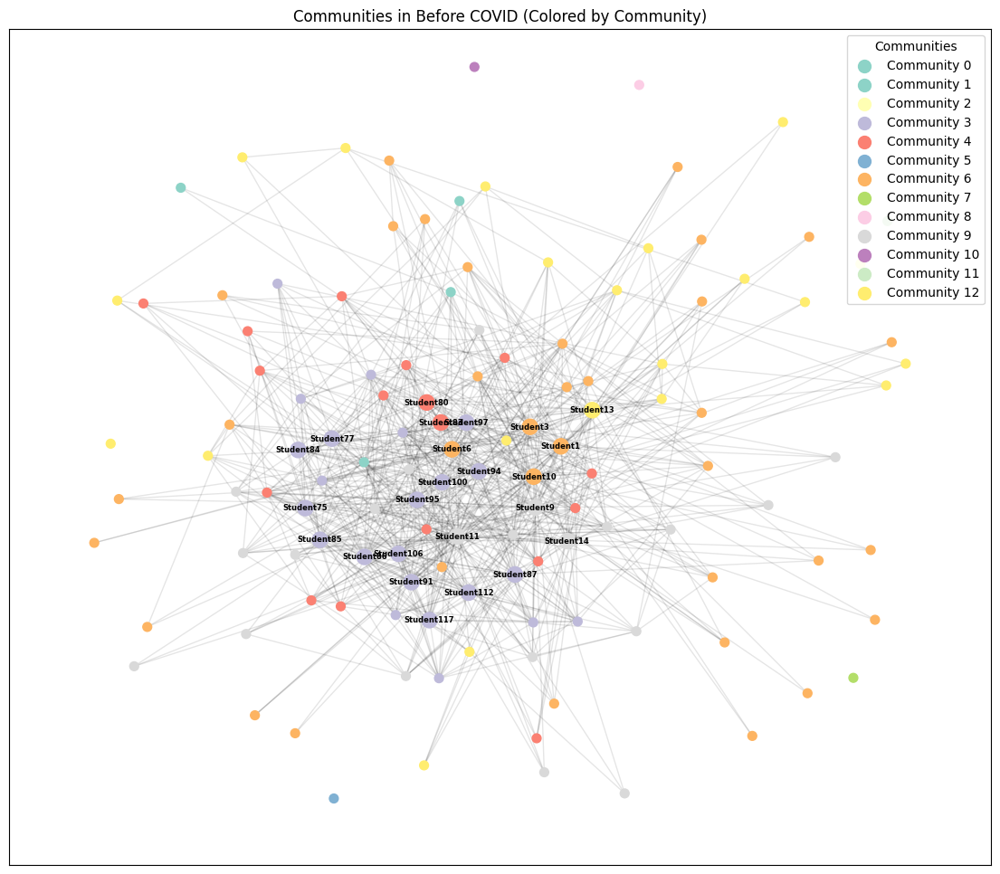

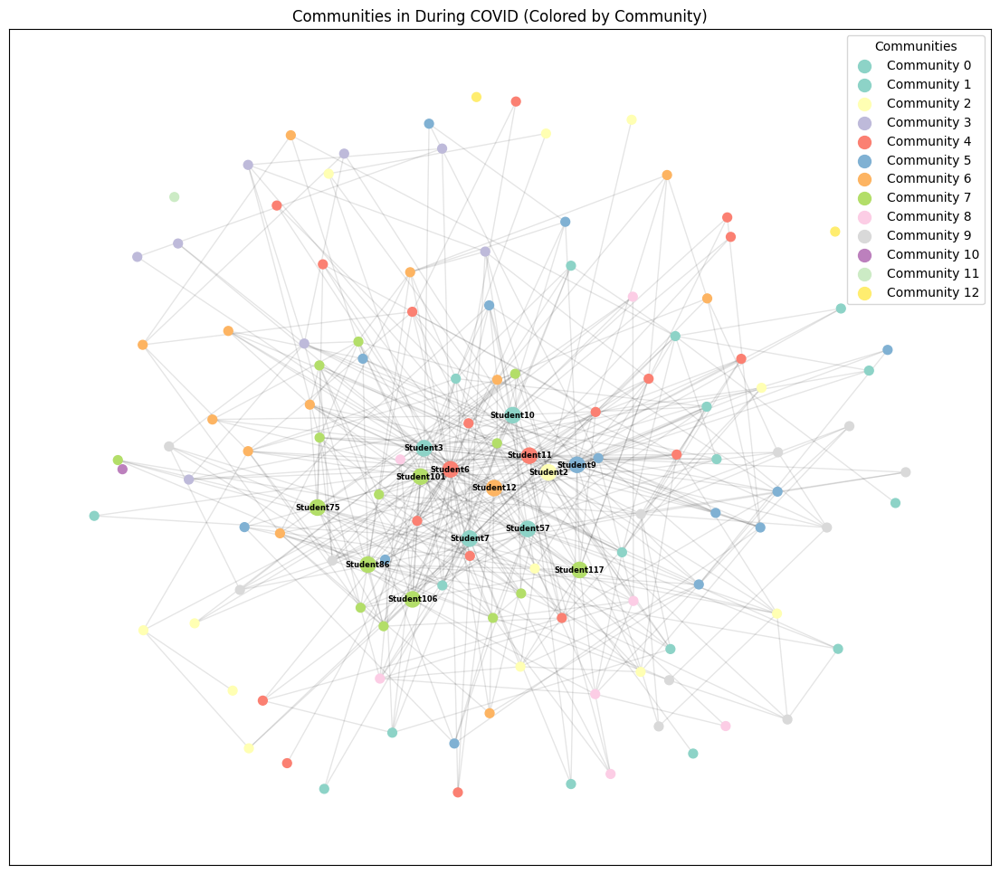

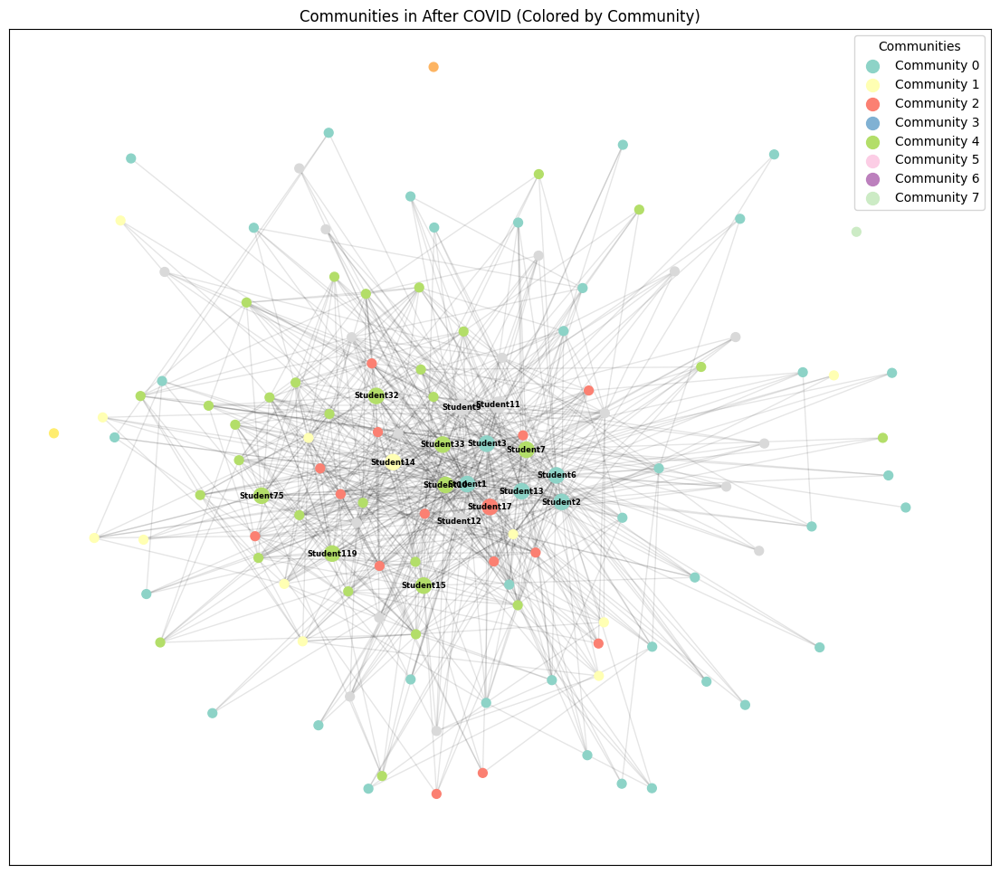

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import community as community_louvain

# Function to visualize communities with reduced density
def visualize_communities(graph, partition, period, attribute='Gender', node_size=50, highlight_centrality=False):
    plt.figure(figsize=(14, 12))
    pos = nx.spring_layout(graph, k=0.8, seed=42)  # Increase k for more spread

    communities = set(partition.values())
    cmap = plt.cm.Set3  # Consistent colormap

    # Default node sizes
    node_sizes = [node_size] * len(graph.nodes())

    # Optional: Highlight high-degree nodes
    if highlight_centrality:
        degree_centrality = nx.degree_centrality(graph)
        # Top 10% of nodes by degree get larger size
        threshold = sorted(degree_centrality.values(), reverse=True)[int(0.1 * len(graph.nodes()))]
        node_sizes = [150 if degree_centrality[node] >= threshold else node_size for node in graph.nodes()]

    # Color nodes by community
    colors = [partition[n] for n in graph.nodes()]

    # Draw nodes and edges
    nx.draw_networkx_nodes(graph, pos, node_color=colors, cmap=cmap, node_size=node_sizes)
    nx.draw_networkx_edges(graph, pos, alpha=0.1)  # Lower alpha for less edge clutter

    # Skip labels to reduce density
    # If you want labels for high-centrality nodes only, uncomment and adjust:
    labels = {n: n for n, size in zip(graph.nodes(), node_sizes) if size > node_size}
    nx.draw_networkx_labels(graph, pos, labels, font_size=6, font_weight='bold')

    # Create legend for communities
    for comm_id in communities:
        plt.scatter([], [], c=[cmap(comm_id / len(communities))], label=f'Community {comm_id}', s=100)
    plt.legend(title="Communities", loc='upper right')

    # Title
    plt.title(f"Communities in {period} COVID (Colored by Community)")

    # Save plot for detailed inspection
    plt.savefig(f"communities_{period.lower()}_covid.png", dpi=300, bbox_inches='tight')
    plt.show()

# Apply to all graphs
partitions = {}
for graph, period in zip(
    [student_graph_before_covid, student_graph_during_covid, student_graph_after_covid],
    ["Before", "During", "After"]
):
    partition = community_louvain.best_partition(graph)
    nx.set_node_attributes(graph, partition, 'community')
    partitions[period] = partition
    visualize_communities(graph, partition, period, node_size=50, highlight_centrality=True)

In [ ]:
import pandas as pd
def summarize_communities(graph, partition, period):
    df = pd.DataFrame({
        'Node': list(graph.nodes()),
        'Community': [partition[n] for n in graph.nodes()]
    })
    print(f"\n{period} COVID: {len(set(partition.values()))} communities")
    print("Community sizes:", df['Community'].value_counts().to_dict())
for period in ["Before", "During", "After"]:
    summarize_communities([student_graph_before_covid, student_graph_during_covid, student_graph_after_covid][["Before", "During", "After"].index(period)], partitions[period], period)


Before COVID: 13 communities
Community sizes: {5: 35, 2: 23, 8: 21, 12: 19, 3: 17, 0: 4, 1: 1, 6: 1, 4: 1, 7: 1, 9: 1, 10: 1, 11: 1}

During COVID: 13 communities
Community sizes: {0: 21, 3: 19, 6: 16, 4: 14, 1: 13, 5: 13, 8: 11, 2: 8, 7: 7, 10: 1, 11: 1, 12: 1, 9: 1}

After COVID: 8 communities
Community sizes: {0: 41, 4: 35, 5: 20, 2: 15, 1: 12, 3: 1, 6: 1, 7: 1}


In [ ]:
import pandas as pd
from tabulate import tabulate

# Summarize community composition with attributes in tabulated format
def summarize_communities_attributes(graph, partition, period):
    # Create DataFrame with node attributes
    df = pd.DataFrame({
        'Node': list(graph.nodes()),
        'Community': [partition[n] for n in graph.nodes()],
        'Gender': [graph.nodes[n]['Gender'] for n in graph.nodes()],
        'Course': [graph.nodes[n]['Course of Study'] for n in graph.nodes()],
        'Year': [graph.nodes[n]['Year of Study'] for n in graph.nodes()]
    })

    # Group by Community and compute distributions
    print(f"\nCommunity Composition ({period} COVID):")

    # Gender Distribution
    gender_dist = df.groupby('Community')['Gender'].value_counts().unstack(fill_value=0)
    print("\nGender Distribution:")
    print(tabulate(gender_dist, headers='keys', tablefmt='fancy_grid', showindex=True))

    # Course Distribution
    course_dist = df.groupby('Community')['Course'].value_counts().unstack(fill_value=0)
    print("\nCourse Distribution:")
    print(tabulate(course_dist, headers='keys', tablefmt='fancy_grid', showindex=True))

    # Year Distribution
    year_dist = df.groupby('Community')['Year'].value_counts().unstack(fill_value=0)
    print("\nYear Distribution:")
    print(tabulate(year_dist, headers='keys', tablefmt='fancy_grid', showindex=True))

    # Save for further analysis
    df.to_csv(f"community_composition_{period.lower()}_covid.csv", index=False)
    return df

# Apply to all graphs
for period in ["Before", "During", "After"]:
    graph = {
        "Before": student_graph_before_covid,
        "During": student_graph_during_covid,
        "After": student_graph_after_covid
    }[period]
    partition = partitions[period]  # Assumes partitions dictionary from previous Louvain run
    df = summarize_communities_attributes(graph, partition, period)


Community Composition (Before COVID):

Gender Distribution:
╒═════════════╤══════════╤════════╕
│   Community │   Female │   Male │
╞═════════════╪══════════╪════════╡
│           0 │        1 │      3 │
├─────────────┼──────────┼────────┤
│           1 │        0 │      1 │
├─────────────┼──────────┼────────┤
│           2 │       12 │     11 │
├─────────────┼──────────┼────────┤
│           3 │        4 │     13 │
├─────────────┼──────────┼────────┤
│           4 │        0 │      1 │
├─────────────┼──────────┼────────┤
│           5 │       10 │     25 │
├─────────────┼──────────┼────────┤
│           6 │        1 │      0 │
├─────────────┼──────────┼────────┤
│           7 │        1 │      0 │
├─────────────┼──────────┼────────┤
│           8 │        8 │     13 │
├─────────────┼──────────┼────────┤
│           9 │        1 │      0 │
├─────────────┼──────────┼────────┤
│          10 │        1 │      0 │
├─────────────┼──────────┼────────┤
│          11 │        1 │      0 │
├──

<Figure size 1000x600 with 0 Axes>

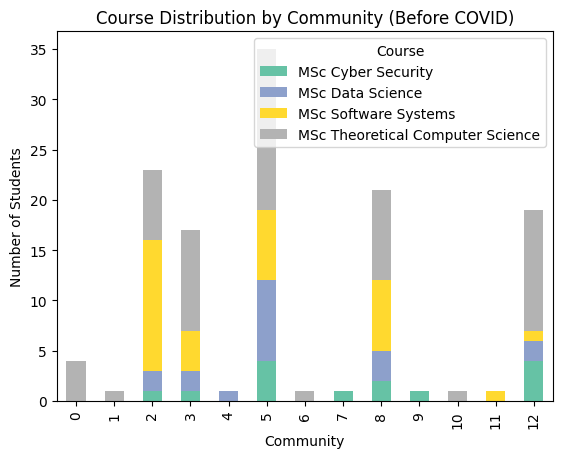

<Figure size 1000x600 with 0 Axes>

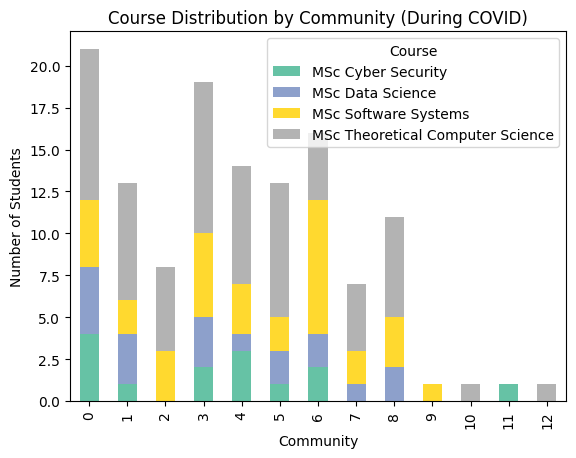

<Figure size 1000x600 with 0 Axes>

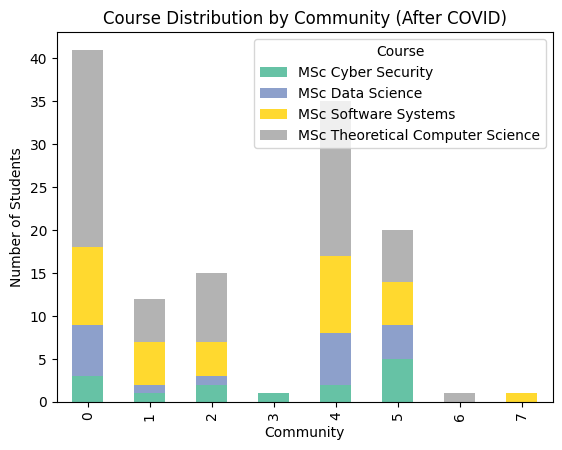

In [ ]:
for period in ["Before", "During", "After"]:
    df = pd.read_csv(f"community_composition_{period.lower()}_covid.csv")
    plt.figure(figsize=(10, 6))
    df.groupby('Community')['Course'].value_counts().unstack().plot(kind='bar', stacked=True, colormap='Set2')
    plt.title(f"Course Distribution by Community ({period} COVID)")
    plt.xlabel("Community")
    plt.ylabel("Number of Students")
    plt.legend(title="Course")
    plt.savefig(f"course_dist_{period.lower()}_covid.png", dpi=300)
    plt.show()

**Interpretations**


**1.  Community Size and Fragmentation**

> **Before COVID (13 communities, 6 singletons):**
Large communities: 5 (35 students), 2 (23), 8 (21), 12 (19), 3 (17).
Singletons: Communities 1, 4, 6, 7, 9, 10, 11 (1 student each).
Interpretation: The network has a mix of large, cohesive groups (likely study groups or social circles) and several isolated students (6 singletons). This suggests a robust in-person social network with some outliers who didn’t connect strongly.


---



> **During COVID (13 communities, 4 singletons):**
Large communities: 0 (21), 3 (19), 6 (16), 4 (14), 1 (13), 5 (13), 8 (11).
Singletons: Communities 9, 10, 11, 12 (1 student each).
Interpretation: The network remains fragmented with 13 communities, but fewer singletons (4 vs. 6). Communities are smaller on average (largest is 21 vs. 35 Before). This suggests COVID reduced interaction intensity, breaking larger groups into smaller ones, possibly due to online learning limiting casual connections.



---



> **After COVID (8 communities, 2 singletons):**
Large communities: 0 (41), 4 (35), 5 (20), 2 (15), 1 (12).
Singletons: Communities 3, 6, 7 (1 student each).
Interpretation: Fewer communities (8 vs. 13) and fewer singletons (2 vs. 4-6) indicate a recovery toward larger, more cohesive groups post-COVID, resembling pre-COVID structure but with even larger communities (e.g., 41 in Community 0).



---



> **Research Insight:** The increase in singletons and smaller communities During COVID supports the hypothesis that remote learning fragmented social networks. The consolidation into fewer, larger communities After COVID suggests a partial recovery of social interactions, possibly as students returned to in-person settings.









**2. Gender Distribution**

**Before COVID:**


*   Large communities (e.g., 5: 10F/25M, 2: 12F/11M) show mixed gender compositions, but some skew (e.g., Community 5 is male-dominated).
*   Singletons: Mostly female (Communities 6, 7, 9, 10, 11), suggesting some female students were less integrated.

> **Interpretation:** Mixed gender communities indicate inclusive interactions, but female singletons may point to gender-specific isolation for a few students.


**During COVID:**


*   Communities are more balanced (e.g., 0: 6F/15M, 6: 10F/6M), with no extreme gender skew.
*   Singletons: All female (9, 10, 11, 12), similar to Before.

>**Interpretation:** Gender balance persists, but the consistent female singletons suggest some female students remained isolated, possibly due to online interaction barriers.


**After COVID:**


*   Large communities (e.g., 0: 16F/25M, 4: 12F/23M) remain mixed but slightly male-skewed.

*   Singletons: Both female (3, 6, 7), fewer than before.

> **Interpretation:** Gender mixing continues, with fewer isolated female students, indicating improved integration post-COVID.



---



>**Research Insight:** The persistence of female singletons across periods (especially During COVID) suggests gender-specific challenges in forming connections, possibly exacerbated by remote learning. The reduction in singletons After COVID indicates improved social integration for female students.

In [ ]:
from sklearn.metrics import normalized_mutual_info_score
nodes = list(student_graph_before_covid.nodes())
labels_before = [partitions["Before"][n] for n in nodes]
labels_during = [partitions["During"][n] for n in nodes]
labels_after = [partitions["After"][n] for n in nodes]
print(f"NMI (Before vs During): {normalized_mutual_info_score(labels_before, labels_during):.4f}")
print(f"NMI (During vs After): {normalized_mutual_info_score(labels_during, labels_after):.4f}")
print(f"NMI (Before vs After): {normalized_mutual_info_score(labels_before, labels_after):.4f}")

NMI (Before vs During): 0.2518
NMI (During vs After): 0.1573
NMI (Before vs After): 0.1968


**Normalised mutual information:**
>NMI measures how similar two community partitions are, with values ranging from 0 (completely different) to 1 (identical).

>**NMI (Before vs During): 0.2518:**
Low similarity, indicating significant changes in community structure during COVID.

>**NMI (During vs After): 0.1573:**
Very low similarity, suggesting substantial restructuring post-COVID.

>**NMI (Before vs After): 0.1968:**
Low similarity, but slightly higher than During vs. After, indicating that the post-COVID structure is somewhat closer to pre-COVID than during-COVID.

In [ ]:
for period, graph in zip(
    ["Before", "During", "After"],
    [student_graph_before_covid, student_graph_during_covid, student_graph_after_covid]
):
    print(f"\n{period} Assortativity:")
    print(f"Gender: {nx.attribute_assortativity_coefficient(graph, 'Gender'):.4f}")
    print(f"Course: {nx.attribute_assortativity_coefficient(graph, 'Course of Study'):.4f}")
    print(f"Year: {nx.attribute_assortativity_coefficient(graph, 'Year of Study'):.4f}")


Before Assortativity:
Gender: -0.0390
Course: -0.0068
Year: 0.0332

During Assortativity:
Gender: 0.0049
Course: -0.0103
Year: -0.0186

After Assortativity:
Gender: -0.0526
Course: -0.0567
Year: 0.0223


> **Assortativity** : measures the tendency of nodes in a network to connect to others with similar attributes.

>*   Positive Assortativity (0 to 1): Nodes with the same attribute values (e.g., same gender) are more likely to connect. Higher values indicate stronger homophily.
>*   Negative Assortativity (-1 to 0): Nodes with different attribute values are more likely to connect (disassortative mixing).
>*   Near Zero (~0): Connections are random with respect to the attribute, showing no strong preference for similarity or dissimilarity.

In our context:
*   Gender Assortativity: Measures if students connect more with others of the same gender.
*   Course Assortativity: Measures if students connect within their academic program (e.g., MSc Data Science).
*   Year Assortativity: Measures if students connect within their cohort (e.g., 2020-25).

>**Interpretation of Assortativity Values:**
Since all values are close to zero, assortativity is generally weak across all periods and attributes, indicating that connections are largely random with respect to Gender, Course, and Year.










In [ ]:
from scipy.stats import chi2_contingency
for period in ["Before", "During", "After"]:
    df = pd.read_csv(f"community_composition_{period.lower()}_covid.csv")
    for attr in ['Gender', 'Course', 'Year']:
        dist = df.groupby('Community')[attr].value_counts().unstack(fill_value=0)
        chi2, p, _, _ = chi2_contingency(dist)
        print(f"Chi-squared {attr} ({period}): p-value = {p:.4f}")

Chi-squared Gender (Before): p-value = 0.2649
Chi-squared Course (Before): p-value = 0.0328
Chi-squared Year (Before): p-value = 0.0176
Chi-squared Gender (During): p-value = 0.2202
Chi-squared Course (During): p-value = 0.7431
Chi-squared Year (During): p-value = 0.2451
Chi-squared Gender (After): p-value = 0.5693
Chi-squared Course (After): p-value = 0.3955
Chi-squared Year (After): p-value = 0.0449


The chi-squared test of independence assesses whether two categorical variables (in your case, Community and an attribute like Gender, Course, or Year) are associated.


Null Hypothesis (H₀): The attribute (e.g., Gender) is independent of community assignment; the distribution of Gender across communities is random.
Alternative Hypothesis (H₁): The attribute is associated with community assignment; certain communities have significantly more/less of a specific attribute value (e.g., more Female students in some communities).
P-value:

Low p-value (<0.05): Reject H₀, indicating a significant association between the attribute and community structure (e.g., communities are gender-skewed).
High p-value (>0.05): Fail to reject H₀, suggesting the attribute distribution across communities is consistent with random assignment.